# Librerías

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.multitest import multipletests
import statsmodels.api as sm
from scipy.stats import shapiro, ttest_rel, wilcoxon, t, chi2_contingency
from tabulate import tabulate
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import OLSInfluence
import math
from statsmodels.stats.power import TTestPower
from statsmodels.stats.contingency_tables import mcnemar
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from statsmodels.formula.api import mixedlm
from scipy.stats import bootstrap

## Semilla

In [2]:
np.random.seed(42)

# Cargo los datos

In [42]:
#!wget https://raw.githubusercontent.com/bitazaratustra/proyecto_gv/main/data/base_ecocardio.csv

df = pd.read_csv('../data/base_ecocardio.csv')
df.shape

(76, 111)

In [43]:
delete_cols = [
    'rumble','DIAL DESD', 'DiastolMITRAL', 'Id1', 'Id', 'ConMS 1', 'VD global', 'POR1', 'Cav 1', 'CONG', 'CEmodsev', 'SUPRAH', 'DIASTOL', 'FEVI',
    'FAV', 'bal 1500', 'bal 1500-3000', 'bal 3000', 'SC', 'SIV', 'PP',
    'AD dil', 'VD1dil', 'VD2dil', 'VD3dil', 'derra', 'TEy', 'VD global'
]

df.drop(columns=delete_cols, inplace=True)

In [44]:
var_demograficas = ["SEX", "EDAD", "HTA", "DBT", "DLP", "AHF", "TBQ", "Acceso"]
var_medicacion = ["BB", "BCA", "IECA", "ARA II", "ARNI", "MRA", "SGLT", "INSULINA"]
var_antropometricas = ["PESO", "TALLA", "HTO", "HB", "ALBUMIN", "KtV", "BALANCE"]
var_dialisis = ['POSDIAL']

var_estaticas = var_demograficas + var_medicacion + var_antropometricas + var_dialisis

var_categoricas = ['NAGUE +','DisfTEI','Disf TAPSE','Disf FAC','Disf Stis','IT','CAVA','PORT','Eeprim VD 6']

In [45]:
encoder = LabelEncoder()
# ordinal = OrdinalEncoder()


for col in var_categoricas:
    df[col] = df[col].where(df[col].isna(), encoder.fit_transform(df[col].values.astype(str)))
    
var_numericas = list(set(df.columns.to_list()) - set(var_categoricas) - set(var_estaticas))

In [46]:
df_pre = df[df['POSDIAL'] == 0]
df_pos = df[df['POSDIAL'] == 1]

## Apuntes

In [47]:
df[(df['IT'] != 0) & (df['vel it'].isna())]

# El paciente 9 tiene diagnosticos de IT pero no se pudo medir PSAP, vel it, y etc. y calculos derivados.
# Por problemas tecnicos no se realizo la medicion de los parametros relacionados con ls IT en el paciente 9.
# Tapse no se mide por carecer de la ventana apropiada
# 

,Paciente,NAGUE +,vel it,Eeprim,AI vol index,SEX,EDAD,POSDIAL,PSAP,TapPsap,...,VD1,VD2,VD3,VCImin,Colap,Ssup,Dsup,SFF,Portmx,Portmin
16,9,1,NaN,17.6,58.6,F,51,1,NaN,NaN,...,34.0,35.0,77.0,8,50,31,28,52,16,14
17,9,1,NaN,25.5,58.6,F,51,0,NaN,NaN,...,36.0,38.0,85.0,9,44,38,34,53,25,19


# EDA

In [48]:
pin_vars = ['SEX', 'HTA', 'DBT', 'DLP', 'AHF', 'TBQ', 'BB', 'BCA', 'IECA', 'ARA II', 'ARNI', 'MRA', 'SGLT', 'INSULINA']


bins = [0, 30, 45, 60, 75, 100]
labels = ['18-30', '31-45', '46-60', '61-75', '76+']
df['Edad_Rango'] = pd.cut(df['EDAD'], bins=bins, labels=labels, right=False)

df_freq = df[df['POSDIAL'] == 1]


def get_freq_table(var):
    freq = df_freq[var].value_counts()
    percentage = df_freq[var].value_counts(normalize=True) * 100
    return freq, percentage


table1_data = []


for var in pin_vars:
    freq, percentage = get_freq_table(var)


    if var == 'SEX':
        categories = {'F': 'Mujer'}
    elif var == 'HTA':
        categories = {1: 'HTA'}
    elif var == 'DBT':
        categories = {1: 'Diabetes'}
    elif var == 'DLP':
        categories = {1: 'Dislipidemia'}
    elif var == 'AHF':
        categories = {1: 'AHF'}
    elif var == 'TBQ':
        categories = {1: 'Tabaquismo'}
    elif var == 'BB':
        categories = {1: 'BB'}
    elif var == 'BCA':
        categories = {1: 'BCA'}
    elif var == 'IECA':
        categories = {1: 'IECA'}
    elif var == 'ARA II':
        categories = {1: 'ARA II'}
    elif var == 'ARNI':
        categories = {1: 'ARNI'}
    elif var == 'MRA':
        categories = {1: 'MRA'}
    elif var == 'SGLT':
        categories = {1: 'SGLT'}
    elif var == 'INSULINA':
        categories = {1: 'INSULINA'}

    else:
        categories = {}


    for category, freq_val in freq.items():
        if category in categories:
            category_name = categories.get(category, category)
            table1_data.append([category_name, freq_val, f"{percentage[category]:.2f}%"])


    missing_categories = set(categories.values()) - set(freq.index)
    for missing_category in missing_categories:

        table1_data.append([missing_category, 0, "0.00%"])

age_freq, age_percentage = get_freq_table('Edad_Rango')
for age, freq_val in age_freq.items():
    table1_data.append([f"Edad {age}", freq_val, f"{age_percentage[age]:.2f}%"])

table1 = pd.DataFrame(table1_data, columns=["Categoría", "Frecuencia Abs", "Frecuencia Relativa (%)"])

table1 = table1[table1["Frecuencia Abs"] > 0]
df.drop(columns='Edad_Rango', inplace=True)
table1

,Categoría,Frecuencia Abs,Frecuencia Relativa (%)
0,Mujer,15,39.47%
2,HTA,28,75.68%
4,Diabetes,11,28.95%
6,Dislipidemia,3,7.89%
9,Tabaquismo,5,13.16%
11,BB,8,21.05%
13,BCA,9,23.68%
15,IECA,6,15.79%
17,ARA II,9,23.68%
19,ARNI,1,2.63%


In [49]:
# def plot_categorical(df, variables, titulo=None, figsize=(20, 15)):

#     sns.set_theme(style="whitegrid")
#     palette = sns.color_palette("Blues_d", n_colors=3)
#     plt.rcParams.update({'font.size': 12, 'font.family': 'sans-serif'})
    
#     n_vars = len(variables)
#     cols = 3
#     rows = (n_vars + cols - 1) // cols
#     fig, axs = plt.subplots(rows, cols, figsize=figsize)
#     fig.subplots_adjust(hspace=0.4, wspace=0.3)
    
#     axs = axs.flatten()
    
#     for i, var in enumerate(variables):
#         counts = df[df['Categoría'].isin([var])]
#         if not counts.empty:
#             abs_freq = counts['Frecuencia Abs'].values[0]
#             rel_freq = counts['Frecuencia Relativa (%)'].values[0]
            
#             ax = axs[i]
#             bars = ax.bar([var], [abs_freq], color=palette[1], alpha=0.85)
            
#             ax.set_title(var, fontsize=14, pad=10)
#             ax.set_ylabel('Frecuencia Absoluta', fontsize=12)
#             ax.tick_params(axis='x', rotation=45)
            
#             ax.annotate(f'{rel_freq}%', 
#                        xy=(bars[0].get_x() + bars[0].get_width()/2, abs_freq),
#                        xytext=(0, 3), textcoords='offset points',
#                        ha='center', va='bottom', fontsize=11)
            
#             sns.despine(left=True, bottom=True)
            
#     for j in range(i+1, len(axs)):
#         axs[j].axis('off')
    
#     if titulo:
#         fig.suptitle(titulo, y=1.02, fontsize=16)
    
#     return fig

# def plot_age_distribution(df, figsize=(10, 6)):
#     age_data = df[df['Categoría'].str.startswith('Edad')]
#     age_data = age_data.copy()
#     age_data['Edad'] = age_data['Categoría'].str.replace('Edad ', '')
#     age_order = ['18-30', '31-45', '46-60', '61-75', '76+']
    
#     sns.set_theme(style="whitegrid")
#     plt.rcParams.update({'font.size': 12})
#     palette = sns.color_palette("Greys_r", n_colors=5)
    
#     fig, ax = plt.subplots(figsize=figsize)
    
#     sns.barplot(x='Edad', y='Frecuencia Abs', data=age_data, 
#                 order=age_order, palette=palette, ax=ax, alpha=0.85)
    
#     ax.set_title('Distribución por Grupos de Edad', fontsize=14, pad=15)
#     ax.set_xlabel('Grupo de Edad', fontsize=12)
#     ax.set_ylabel('Frecuencia Absoluta', fontsize=12)
#     ax.tick_params(axis='x', rotation=45)
    
#     for p in ax.patches:
#         height = p.get_height()
#         ax.annotate(f'{height:.0f}',
#                     xy=(p.get_x() + p.get_width()/2, height),
#                     xytext=(0, 3), textcoords='offset points',
#                     ha='center', va='bottom', fontsize=11)
    
#     sns.despine(left=True, bottom=True)
#     return fig


# plot_categorical(table1, categorical_vars, titulo=None, figsize=(20, 15))
# plot_age_distribution(table1, figsize=(10, 6))

In [50]:
# variables_ = [
#     'vel it', 'Eeprim', 'AI vol index', 'TapPsap', 'grIT', 'StisVD', 'FEy',
#     'EA VD', 'EtisVD', 'Eeprim VD', '%fac', 'SFF', 'TAPSE', 'TEI', 'FAC', 'TAM',
#     'TAD', 'TAS', 'Tdec', 'VCImax', 'EVD', 'A VD', 'Eprim', 'FC', 'DDVI', 'IDDVI',
#     'DSVI', 'VTI', 'GC', 'IC', 'VS', 'IVS', 'IMVI', 'VD1', 'VD2', 'VD3', 'VCImin',
#     'Colap', 'Ssup', 'Dsup', 'PSAP', 'BALANCE', 'KtV', 'Anillo', 'Portmx', 'Portmin'
# ]


# static_cols = [
#     'Paciente', 'POSDIAL', 'Acceso', 'SEX', 'EDAD', 'HTA', 'DBT', 'DLP', 'AHF',
#     'TBQ', 'BB', 'BCA', 'IECA', 'PESO','TALLA', 'ARA II', 'ARNI', 'MRA', 'SGLT',
#     'INSULINA', 'HTO', 'HB', 'ALBUMIN'
# ]

# covariates = [
#               'Acceso', 'SEX', 'HTA', 'DBT', 'DLP', 'AHF',
#               'TBQ', 'BB', 'BCA', 'IECA', 'ARA II', 'ARNI', 'MRA', 'SGLT',
#               'INSULINA'
#             ]

## Nague +

Frecuencias Pre-Diálisis:
NAGUE +
1    22
0    16
Name: count, dtype: int64

Proporciones Pre-Diálisis:
NAGUE +
1    0.578947
0    0.421053
Name: proportion, dtype: float64


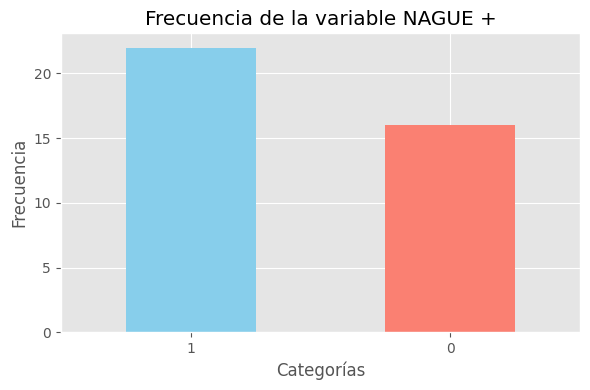

Frecuencias Post-Diálisis:
NAGUE +
0    26
1    12
Name: count, dtype: int64

Proporciones Post-Diálisis:
NAGUE +
0    0.684211
1    0.315789
Name: proportion, dtype: float64


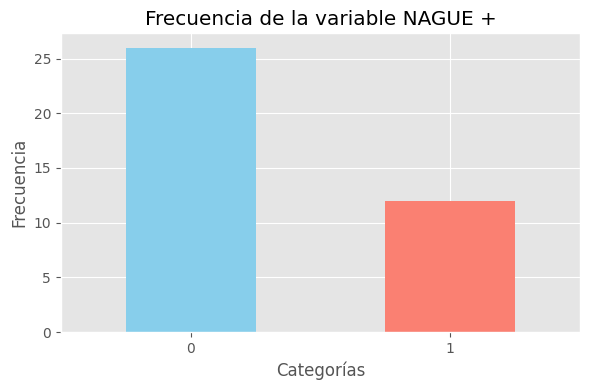

In [51]:
frecuencia_pre = df_pre['NAGUE +'].value_counts()
proporciones_pre = df_pre['NAGUE +'].value_counts(normalize=True)


frecuencia_pos = df_pos['NAGUE +'].value_counts()
proporciones_pos = df_pos['NAGUE +'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['NAGUE +'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable NAGUE +')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['NAGUE +'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable NAGUE +')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [52]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='NAGUE +').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.00195


Despues,0,1
Antes,,
0,16,0
1,10,12


## DisfTEI

Frecuencias Pre-Diálisis:
DisfTEI
1.0    26
0.0    11
Name: count, dtype: int64

Proporciones Pre-Diálisis:
DisfTEI
1.0    0.702703
0.0    0.297297
Name: proportion, dtype: float64


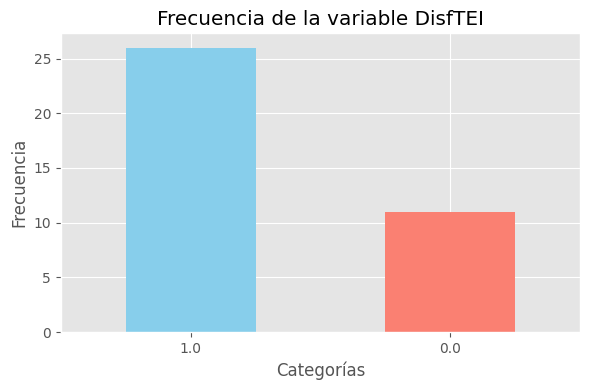

Frecuencias Post-Diálisis:
DisfTEI
1.0    23
0.0    14
Name: count, dtype: int64

Proporciones Post-Diálisis:
DisfTEI
1.0    0.621622
0.0    0.378378
Name: proportion, dtype: float64


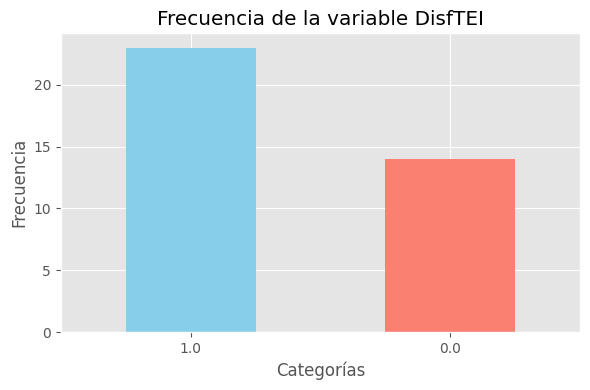

In [53]:
frecuencia_pre = df_pre['DisfTEI'].value_counts()
proporciones_pre = df_pre['DisfTEI'].value_counts(normalize=True)


frecuencia_pos = df_pos['DisfTEI'].value_counts()
proporciones_pos = df_pos['DisfTEI'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['DisfTEI'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable DisfTEI')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['DisfTEI'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable DisfTEI')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [54]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='DisfTEI').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.54883


Despues,0.0,1.0
Antes,,
0.0,7,4
1.0,7,19


## Disf TAPSE

Frecuencias Pre-Diálisis:
Disf TAPSE
1.0    32
0.0     5
Name: count, dtype: int64

Proporciones Pre-Diálisis:
Disf TAPSE
1.0    0.864865
0.0    0.135135
Name: proportion, dtype: float64


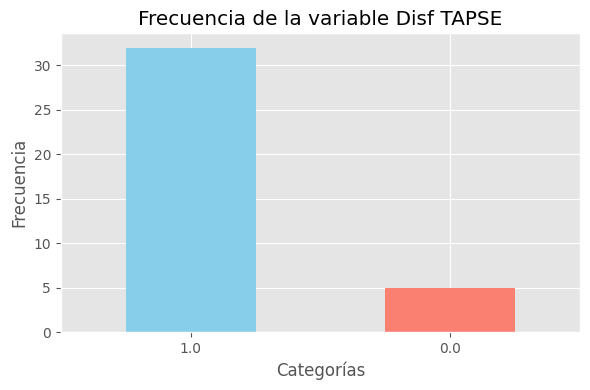

Frecuencias Post-Diálisis:
Disf TAPSE
1.0    29
0.0     8
Name: count, dtype: int64

Proporciones Post-Diálisis:
Disf TAPSE
1.0    0.783784
0.0    0.216216
Name: proportion, dtype: float64


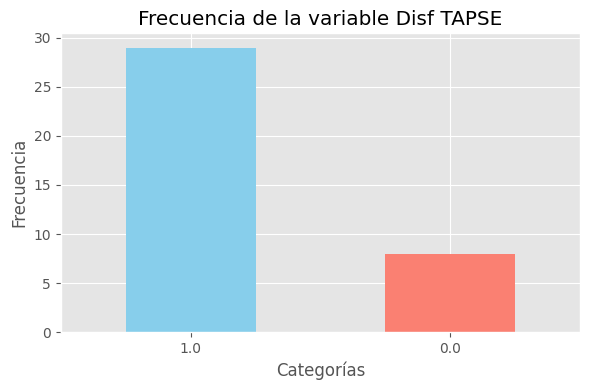

In [55]:
frecuencia_pre = df_pre['Disf TAPSE'].value_counts()
proporciones_pre = df_pre['Disf TAPSE'].value_counts(normalize=True)


frecuencia_pos = df_pos['Disf TAPSE'].value_counts()
proporciones_pos = df_pos['Disf TAPSE'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['Disf TAPSE'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf TAPSE')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['Disf TAPSE'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf TAPSE')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Corte en 17 -  Guia de evaluacion de cavidades derechas.Guidelines for echocardiographyc assasment of the rigth heart in adult. JASE 2010 

In [56]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='Disf TAPSE').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.37500


Despues,0.0,1.0
Antes,,
0.0,4,1
1.0,4,28


## Disf FAC

Frecuencias Pre-Diálisis:
Disf FAC
1.0    32
0.0     4
Name: count, dtype: int64

Proporciones Pre-Diálisis:
Disf FAC
1.0    0.888889
0.0    0.111111
Name: proportion, dtype: float64


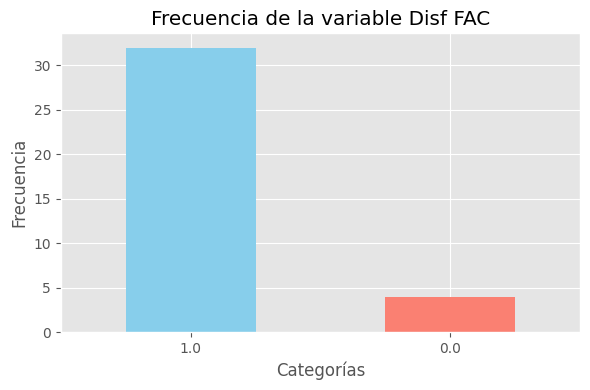

Frecuencias Post-Diálisis:
Disf FAC
1.0    30
0.0     6
Name: count, dtype: int64

Proporciones Post-Diálisis:
Disf FAC
1.0    0.833333
0.0    0.166667
Name: proportion, dtype: float64


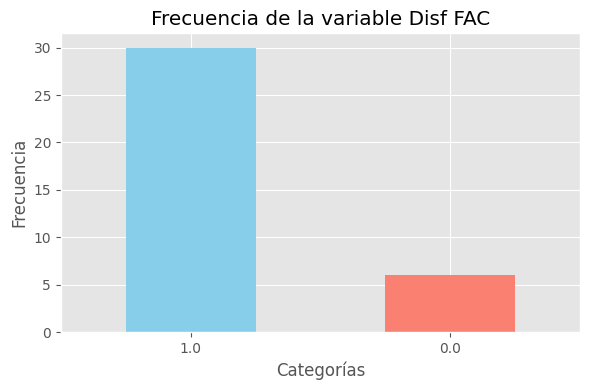

In [57]:
frecuencia_pre = df_pre['Disf FAC'].value_counts()
proporciones_pre = df_pre['Disf FAC'].value_counts(normalize=True)


frecuencia_pos = df_pos['Disf FAC'].value_counts()
proporciones_pos = df_pos['Disf FAC'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['Disf FAC'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf FAC')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['Disf FAC'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf FAC')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [58]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='Disf FAC').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.62500


Despues,0.0,1.0
Antes,,
0.0,3,1
1.0,3,29


## Disf Stis

Frecuencias Pre-Diálisis:
Disf Stis
1.0    31
0.0     6
Name: count, dtype: int64

Proporciones Pre-Diálisis:
Disf Stis
1.0    0.837838
0.0    0.162162
Name: proportion, dtype: float64


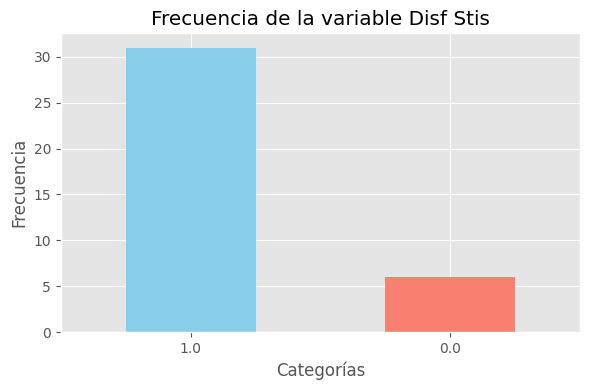

Frecuencias Post-Diálisis:
Disf Stis
1.0    24
0.0    13
Name: count, dtype: int64

Proporciones Post-Diálisis:
Disf Stis
1.0    0.648649
0.0    0.351351
Name: proportion, dtype: float64


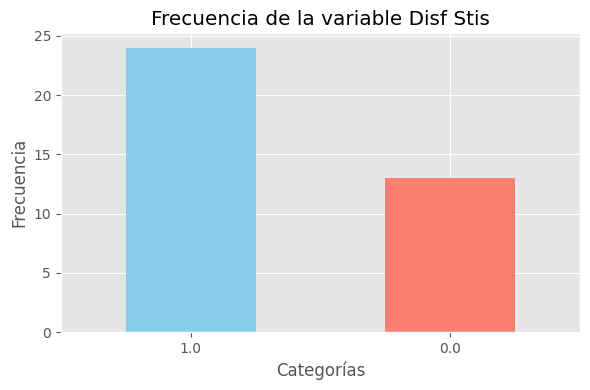

In [59]:
frecuencia_pre = df_pre['Disf Stis'].value_counts()
proporciones_pre = df_pre['Disf Stis'].value_counts(normalize=True)


frecuencia_pos = df_pos['Disf Stis'].value_counts()
proporciones_pos = df_pos['Disf Stis'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['Disf Stis'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf Stis')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['Disf Stis'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf Stis')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [60]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='Disf Stis').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.03906


Despues,0.0,1.0
Antes,,
0.0,5,1
1.0,8,23


## IT

Frecuencias Pre-Diálisis:
IT
1    24
0    12
2     1
3     1
Name: count, dtype: int64

Proporciones Pre-Diálisis:
IT
1    0.631579
0    0.315789
2    0.026316
3    0.026316
Name: proportion, dtype: float64


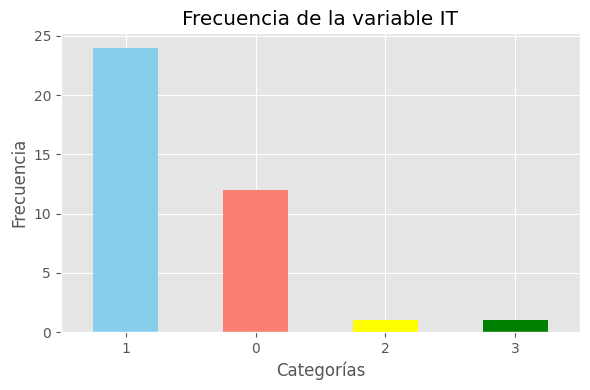

Frecuencias Post-Diálisis:
IT
0    20
1    16
2     1
3     1
Name: count, dtype: int64

Proporciones Post-Diálisis:
IT
0    0.526316
1    0.421053
2    0.026316
3    0.026316
Name: proportion, dtype: float64


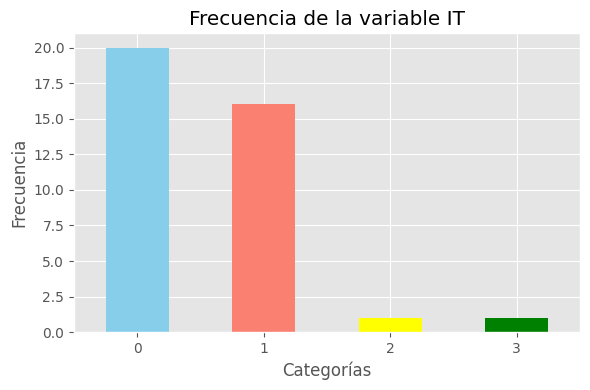

In [61]:

frecuencia_pre = df_pre['IT'].value_counts()
proporciones_pre = df_pre['IT'].value_counts(normalize=True)


frecuencia_pos = df_pos['IT'].value_counts()
proporciones_pos = df_pos['IT'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['IT'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'yellow', 'green'])
plt.title('Frecuencia de la variable IT')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['IT'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'yellow', 'green'])
plt.title('Frecuencia de la variable IT')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


# Leve, moderada, severa, sin it

In [62]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='IT').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.02148


Despues,0,1,2,3
Antes,,,,
0,11,1,0,0
1,9,15,0,0
2,0,0,1,0
3,0,0,0,1


## CAVA

In [63]:
df['CAVA'].value_counts()
# Sin dilatar colapsante 1, dilatada sin colapso 3, intermedia 2

CAVA
0    47
2    15
1    14
Name: count, dtype: int64

Frecuencias Pre-Diálisis:
CAVA
0    15
2    12
1    11
Name: count, dtype: int64

Proporciones Pre-Diálisis:
CAVA
0    0.394737
2    0.315789
1    0.289474
Name: proportion, dtype: float64


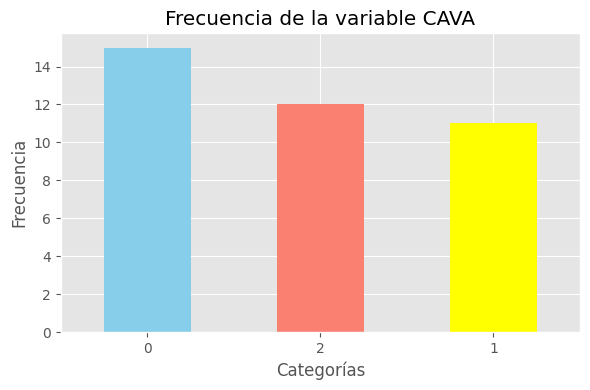

Frecuencias Post-Diálisis:
CAVA
0    32
2     3
1     3
Name: count, dtype: int64

Proporciones Post-Diálisis:
CAVA
0    0.842105
2    0.078947
1    0.078947
Name: proportion, dtype: float64


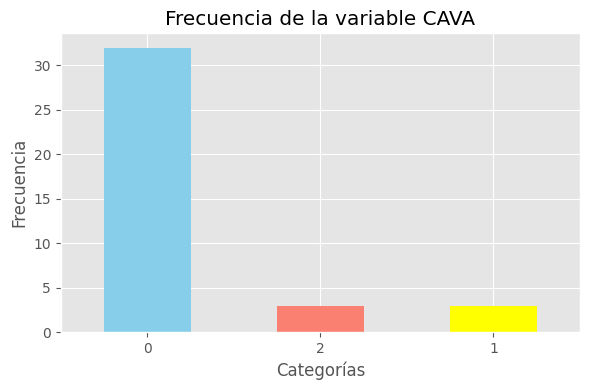

In [64]:
frecuencia_pre = df_pre['CAVA'].value_counts()
proporciones_pre = df_pre['CAVA'].value_counts(normalize=True)


frecuencia_pos = df_pos['CAVA'].value_counts()
proporciones_pos = df_pos['CAVA'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['CAVA'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'yellow'])
plt.title('Frecuencia de la variable CAVA')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['CAVA'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'yellow'])
plt.title('Frecuencia de la variable CAVA')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


In [65]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='CAVA').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.00098


Despues,0,1,2
Antes,,,
0,15,0,0
1,11,0,0
2,6,3,3


## PORT

Frecuencias Pre-Diálisis:
PORT
0    15
1    12
2    11
Name: count, dtype: int64

Proporciones Pre-Diálisis:
PORT
0    0.394737
1    0.315789
2    0.289474
Name: proportion, dtype: float64


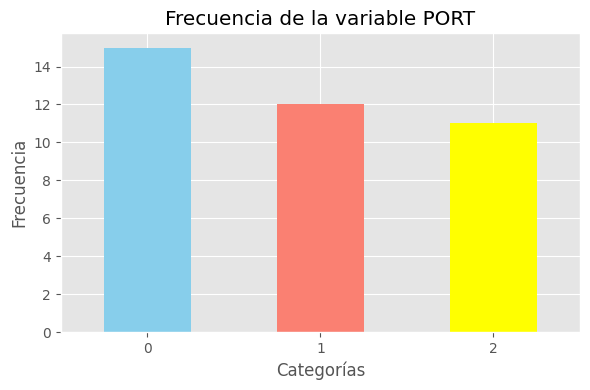

Frecuencias Post-Diálisis:
PORT
0    28
1     9
2     1
Name: count, dtype: int64

Proporciones Post-Diálisis:
PORT
0    0.736842
1    0.236842
2    0.026316
Name: proportion, dtype: float64


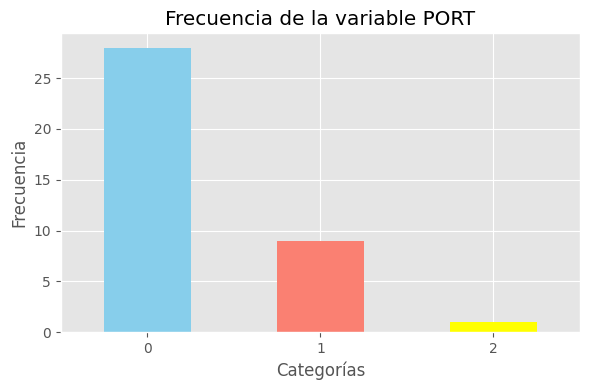

In [66]:


frecuencia_pre = df_pre['PORT'].value_counts()
proporciones_pre = df_pre['PORT'].value_counts(normalize=True)


frecuencia_pos = df_pos['PORT'].value_counts()
proporciones_pos = df_pos['PORT'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['PORT'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'yellow'])
plt.title('Frecuencia de la variable PORT')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['PORT'].value_counts().plot(kind='bar', color=['skyblue', 'salmon', 'yellow'])
plt.title('Frecuencia de la variable PORT')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


In [67]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='PORT').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.01562


Despues,0,1,2
Antes,,,
0,15,0,0
1,7,5,0
2,6,4,1


## Eeprim VD 6

In [68]:
df_pre['Eeprim VD 6'].value_counts()

Eeprim VD 6
1.0    26
0.0    11
Name: count, dtype: int64

Frecuencias Pre-Diálisis:
Eeprim VD 6
1.0    26
0.0    11
Name: count, dtype: int64

Proporciones Pre-Diálisis:
Eeprim VD 6
1.0    0.702703
0.0    0.297297
Name: proportion, dtype: float64


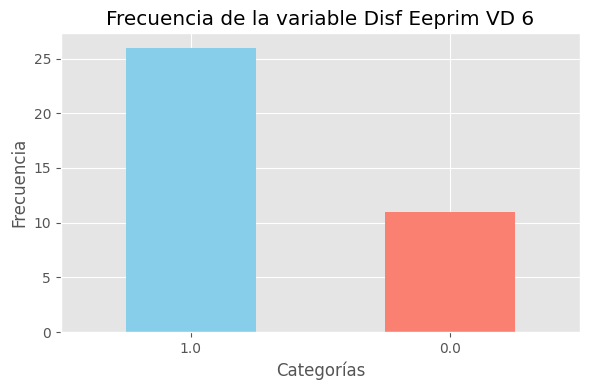

Frecuencias Post-Diálisis:
Eeprim VD 6
1.0    21
0.0    16
Name: count, dtype: int64

Proporciones Post-Diálisis:
Eeprim VD 6
1.0    0.567568
0.0    0.432432
Name: proportion, dtype: float64


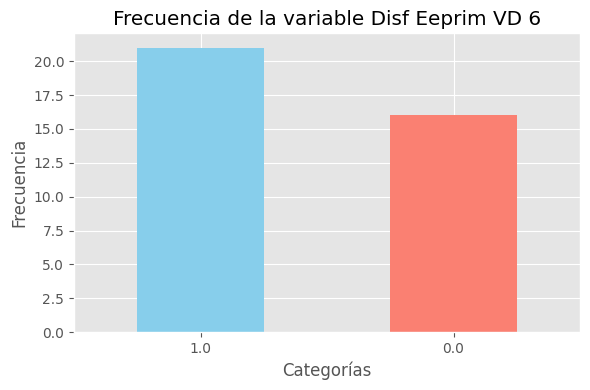

In [69]:
frecuencia_pre = df_pre['Eeprim VD 6'].value_counts()
proporciones_pre = df_pre['Eeprim VD 6'].value_counts(normalize=True)


frecuencia_pos = df_pos['Eeprim VD 6'].value_counts()
proporciones_pos = df_pos['Eeprim VD 6'].value_counts(normalize=True)

print("Frecuencias Pre-Diálisis:")
print(frecuencia_pre)
print("\nProporciones Pre-Diálisis:")
print(proporciones_pre)

# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pre['Eeprim VD 6'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf Eeprim VD 6')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

print("Frecuencias Post-Diálisis:")
print(frecuencia_pos)
print("\nProporciones Post-Diálisis:")
print(proporciones_pos)


# Gráfico de barras
plt.figure(figsize=(6, 4))
df_pos['Eeprim VD 6'].value_counts().plot(kind='bar', color=['skyblue', 'salmon'])
plt.title('Frecuencia de la variable Disf Eeprim VD 6')
plt.xlabel('Categorías')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# 1 significa mayor a 6

In [70]:
df_wide = df.pivot(index='Paciente', columns='POSDIAL', values='Eeprim VD 6').dropna()
df_wide.columns = ['Antes', 'Despues']

contingency_table = pd.crosstab(df_wide['Antes'], df_wide['Despues'])


result = mcnemar(contingency_table, exact=True)
print(f"\nPrueba de McNemar: p-valor = {result.pvalue:.5f}")

contingency_table


Prueba de McNemar: p-valor = 0.22656


Despues,0.0,1.0
Antes,,
0.0,8,3
1.0,8,18


# Variables Nméricas

In [71]:
missing_threshold = 1

no_numericas = var_estaticas + var_categoricas
initial_variables = df.drop(columns=no_numericas).columns.tolist()

missing_stats = []
for var in initial_variables:
    pre_missing = df[df['POSDIAL'] == 0][var].isna().mean()
    post_missing = df[df['POSDIAL'] == 1][var].isna().mean()
    max_missing = max(pre_missing, post_missing)
    missing_stats.append((var, max_missing))

variables_to_analyze = [var for var, missing in missing_stats if missing <= missing_threshold]

it_dependent_vars = [] # ['vel it', 'PSAP', 'TapPsap', 'grIT']
non_it_vars = [var for var in variables_to_analyze if var not in it_dependent_vars]

In [72]:
df['IT_status'] = df['IT'].apply(lambda x: 0 if x == 0 else 1)

In [73]:
scaler = StandardScaler()
df_z = df.copy()
df_z[var_numericas] = scaler.fit_transform(df[var_numericas])
df_z = df_z.add_suffix('_z') if len(var_numericas) > 0 else df.copy()

In [74]:
df[var_numericas]

,TAM,Eprim,GC,Tdec,StisVD,Colap,DSVI,TAS,PSAP,EVD,...,IC,FAC,TdecVD,TAD,vel it,grIT,Ssup,Paciente,EA,FEy
0,68.000000,9.0,6386,173,14.3,70,36,104,NaN,65,...,4010,48.0,108,50,NaN,NaN,68,1,1.16,57
1,76.666667,8.0,5345,187,11.2,67,38,110,NaN,43,...,3357,38.0,320,60,NaN,NaN,59,1,0.84,55
2,96.666667,4.3,5551,120,10.5,36,29,130,NaN,37,...,3143,51.0,236,80,NaN,NaN,20,2,0.54,66
3,83.333333,4.4,6712,140,13.4,11,38,126,NaN,50,...,3800,52.0,229,62,NaN,NaN,23,2,0.65,60
4,60.000000,5.4,3341,252,6.5,100,25,80,NaN,39,...,2402,NaN,269,50,NaN,NaN,18,3,0.80,73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,131.666667,4.5,7003,141,3.5,13,52,175,70.0,78,...,3005,20.0,141,110,3.708,55.0,19,35,1.47,15
72,126.666667,7.2,9573,156,16.0,17,46,170,57.0,48,...,5644,36.0,232,105,3.240,42.0,33,37,1.43,38
73,119.666667,6.6,10470,190,14.0,62,45,173,47.0,110,...,6174,36.0,160,93,3.317,44.0,50,37,1.64,42
74,115.000000,7.4,4284,82,8.6,12,49,145,39.0,106,...,2830,39.0,83,100,2.449,24.0,-49,38,2.51,24


In [75]:
# variables_ = [
#     'vel it', 'Eeprim', 'AI vol index', 'TapPsap', 'grIT', 'StisVD', 'FEy',
#     'EA VD', 'EtisVD', 'Eeprim VD', '%fac', 'SFF', 'TAPSE', 'TEI', 'FAC', 'TAM',
#     'TAD', 'TAS', 'Tdec', 'VCImax', 'EVD', 'A VD', 'Eprim', 'FC', 'DDVI', 'IDDVI',
#     'DSVI', 'VTI', 'GC', 'IC', 'VS', 'IVS', 'IMVI', 'VD1', 'VD2', 'VD3', 'VCImin',
#     'Colap', 'Ssup', 'Dsup', 'PSAP', 'BALANCE', 'KtV', 'Anillo', 'Portmx', 'Portmin',
# ]

════════════════════════════════════════════════════════════
Variables excluidas por >100% missing:
set()
════════════════════════════════════════════════════════════

[ANÁLISIS DE VALORES PERDIDOS - VARIABLES INCLUIDAS]
+--------------+-------------------+-----------------+------------------+-----------------+----------+----------+----------+----------+----------+----------+---------+----------+-----------+-------------+-----------+----------+-----------+---------------+-------------------------+
|   Variable   | Pacientes Totales | Pre-Missing (%) | Post-Missing (%) | Pares Completos | MCAR_SEX | MCAR_HTA | MCAR_DBT | MCAR_DLP | MCAR_AHF | MCAR_TBQ | MCAR_BB | MCAR_BCA | MCAR_IECA | MCAR_ARA II | MCAR_ARNI | MCAR_MRA | MCAR_SGLT | MCAR_INSULINA | Significativas (p<0.05) |
+--------------+-------------------+-----------------+------------------+-----------------+----------+----------+----------+----------+----------+----------+---------+----------+-----------+-------------+-----------

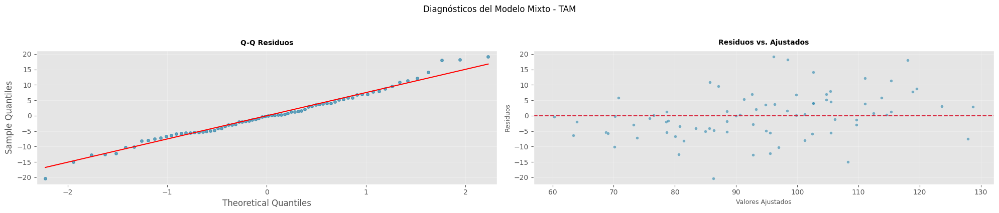


    🔍 ANÁLISIS DE SENSIBILIDAD - TAM
    ▪ Modelo mixto: β = -9.84 (IC95% -14.36--5.32, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-14.17, -5.78]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.11, -1.58]
────────────────────────────────────────────────────────────────────────────────


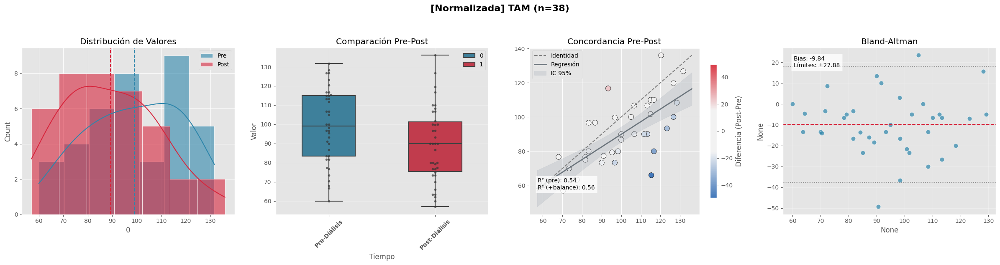


    📊 ANÁLISIS ESTADÍSTICO - TAM
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.50 (-0.73 a -0.26)
    ▪ Diferencia media (IC 95%) [Original]: -9.84 (-14.36 a -5.32)
    ▪ Prueba de normalidad: W = 0.977, p = 0.6025
    ▪ Prueba seleccionada: t(37) = 4.27, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.69
    ▪ R² (solo pre): 0.539
    ▪ R² (pre + balance): 0.557
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TAM: 19 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


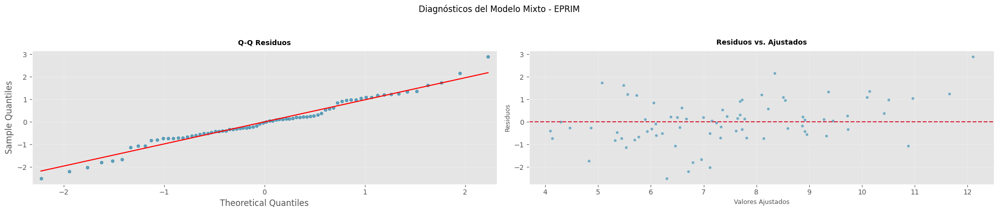


    🔍 ANÁLISIS DE SENSIBILIDAD - EPRIM
    ▪ Modelo mixto: β = -1.23 (IC95% -1.81--0.65, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-1.81, -0.66]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.16, -1.60]
────────────────────────────────────────────────────────────────────────────────


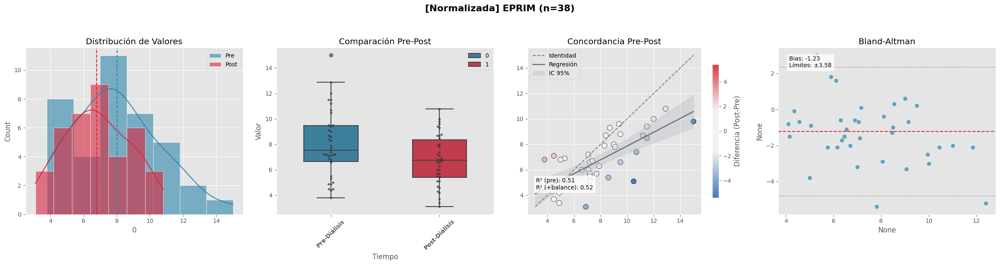


    📊 ANÁLISIS ESTADÍSTICO - EPRIM
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.52 (-0.77 a -0.27)
    ▪ Diferencia media (IC 95%) [Original]: -1.23 (-1.81 a -0.65)
    ▪ Prueba de normalidad: W = 0.976, p = 0.5701
    ▪ Prueba seleccionada: t(37) = 4.15, p = 0.0002
    ▪ Tamaño del efecto (Cohen's d): -0.67
    ▪ R² (solo pre): 0.514
    ▪ R² (pre + balance): 0.518
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Eprim: 20 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


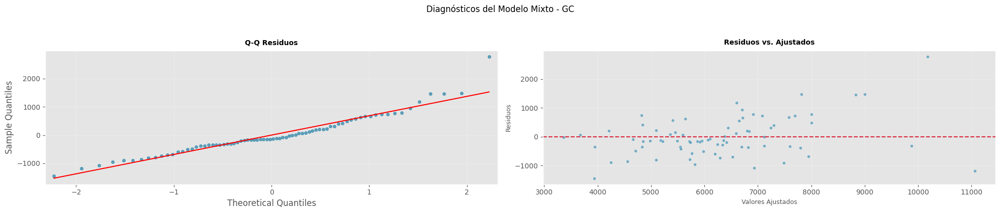


    🔍 ANÁLISIS DE SENSIBILIDAD - GC
    ▪ Modelo mixto: β = -883.87 (IC95% -1295.17--472.56, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-1291.05, -471.95]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-3.98, -1.64]
────────────────────────────────────────────────────────────────────────────────


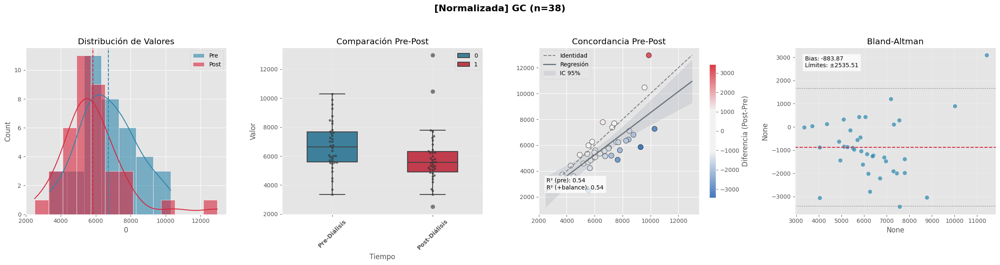


    📊 ANÁLISIS ESTADÍSTICO - GC
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.49 (-0.73 a -0.26)
    ▪ Diferencia media (IC 95%) [Original]: -883.87 (-1295.18 a -472.56)
    ▪ Prueba de normalidad: W = 0.971, p = 0.4146
    ▪ Prueba seleccionada: t(37) = 4.21, p = 0.0002
    ▪ Tamaño del efecto (Cohen's d): -0.68
    ▪ R² (solo pre): 0.540
    ▪ R² (pre + balance): 0.540
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en GC: 19 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


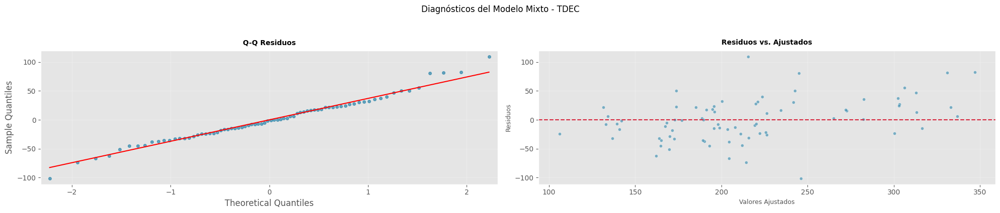


    🔍 ANÁLISIS DE SENSIBILIDAD - TDEC
    ▪ Modelo mixto: β = 30.66 (IC95% 9.09-52.22, p=0.0053)
    ▪ Bootstrapping BCa (IC95%): [7.71, 50.64]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.08, -1.58]
────────────────────────────────────────────────────────────────────────────────


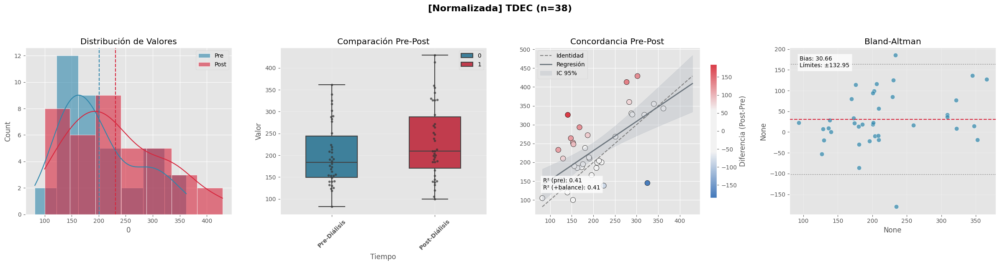


    📊 ANÁLISIS ESTADÍSTICO - TDEC
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.39 (0.11 a 0.67)
    ▪ Diferencia media (IC 95%) [Original]: 30.66 (9.09 a 52.23)
    ▪ Prueba de normalidad: W = 0.953, p = 0.1101
    ▪ Prueba seleccionada: t(37) = -2.79, p = 0.0084
    ▪ Tamaño del efecto (Cohen's d): 0.45
    ▪ R² (solo pre): 0.411
    ▪ R² (pre + balance): 0.412
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Tdec: 41 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


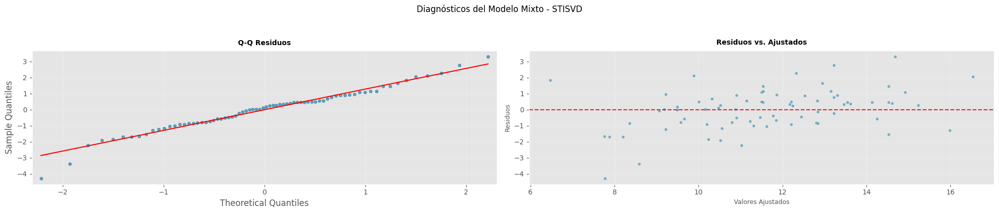


    🔍 ANÁLISIS DE SENSIBILIDAD - STISVD
    ▪ Modelo mixto: β = -1.30 (IC95% -2.07--0.54, p=0.0008)
    ▪ Bootstrapping BCa (IC95%): [-2.00, -0.49]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.15, -1.61]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


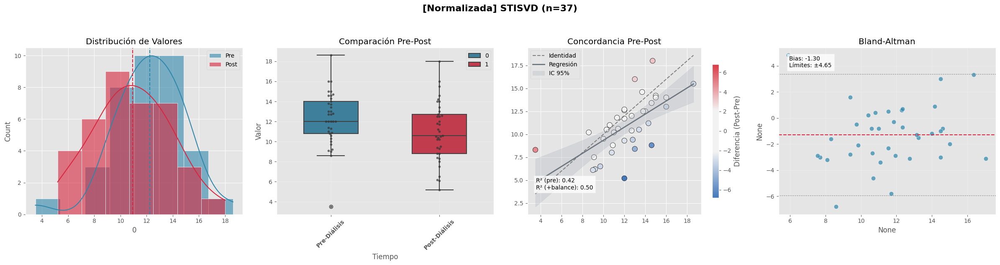


    📊 ANÁLISIS ESTADÍSTICO - STISVD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.46 (-0.73 a -0.18)
    ▪ Diferencia media (IC 95%) [Original]: -1.30 (-2.07 a -0.54)
    ▪ Prueba de normalidad: W = 0.974, p = 0.5371
    ▪ Prueba seleccionada: t(36) = 3.34, p = 0.0019
    ▪ Tamaño del efecto (Cohen's d): -0.55
    ▪ R² (solo pre): 0.423
    ▪ R² (pre + balance): 0.499
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en StisVD: 28 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


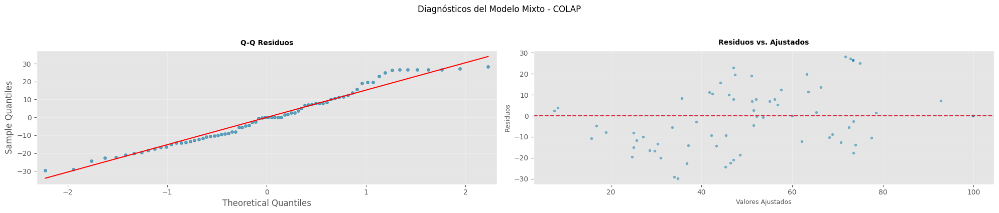


    🔍 ANÁLISIS DE SENSIBILIDAD - COLAP
    ▪ Modelo mixto: β = 26.47 (IC95% 17.80-35.14, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [18.49, 35.78]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.23, -1.74]
────────────────────────────────────────────────────────────────────────────────


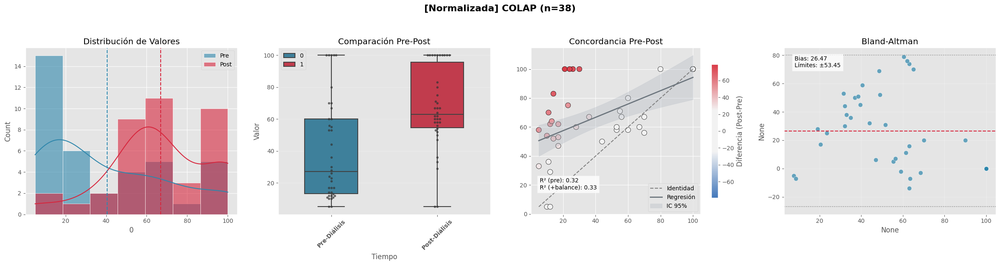


    📊 ANÁLISIS ESTADÍSTICO - COLAP
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.84 (0.56 a 1.13)
    ▪ Diferencia media (IC 95%) [Original]: 26.47 (17.80 a 35.14)
    ▪ Prueba de normalidad: W = 0.933, p = 0.0248
    ▪ Prueba seleccionada: Z = -4.953, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): 0.97
    ▪ R² (solo pre): 0.319
    ▪ R² (pre + balance): 0.327
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Colap: 11 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


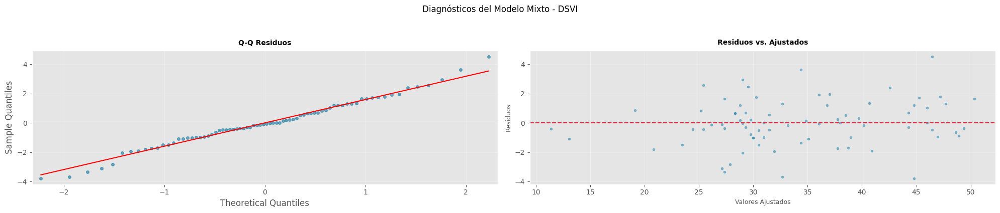


    🔍 ANÁLISIS DE SENSIBILIDAD - DSVI
    ▪ Modelo mixto: β = -1.68 (IC95% -2.70--0.67, p=0.0011)
    ▪ Bootstrapping BCa (IC95%): [-2.79, -0.72]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.10, -1.51]
────────────────────────────────────────────────────────────────────────────────


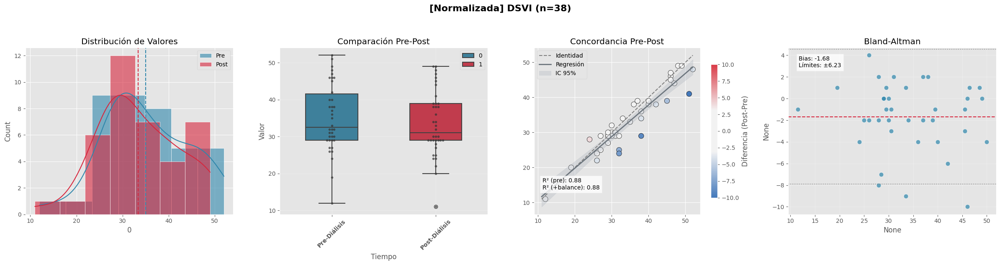


    📊 ANÁLISIS ESTADÍSTICO - DSVI
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.19 (-0.31 a -0.07)
    ▪ Diferencia media (IC 95%) [Original]: -1.68 (-2.70 a -0.67)
    ▪ Prueba de normalidad: W = 0.932, p = 0.0240
    ▪ Prueba seleccionada: Z = -3.676, p = 0.0034
    ▪ Tamaño del efecto (Cohen's d): -0.53
    ▪ R² (solo pre): 0.881
    ▪ R² (pre + balance): 0.881
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en DSVI: 30 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


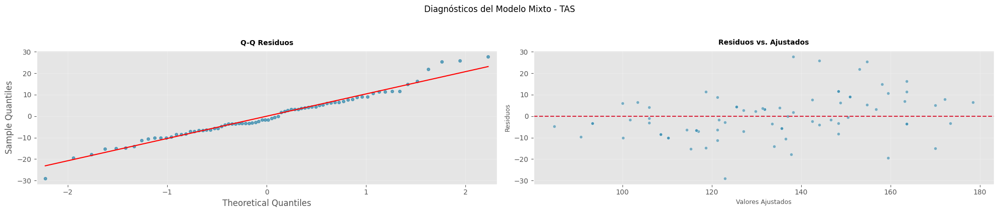


    🔍 ANÁLISIS DE SENSIBILIDAD - TAS
    ▪ Modelo mixto: β = -15.32 (IC95% -21.55--9.08, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-21.70, -9.43]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.22, -1.65]
────────────────────────────────────────────────────────────────────────────────


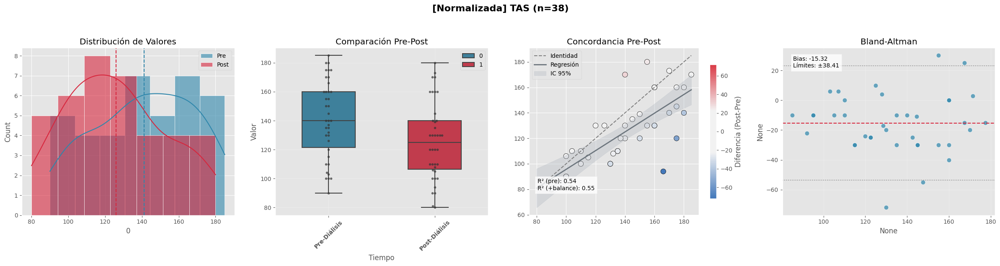


    📊 ANÁLISIS ESTADÍSTICO - TAS
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.55 (-0.79 a -0.32)
    ▪ Diferencia media (IC 95%) [Original]: -15.32 (-21.55 a -9.08)
    ▪ Prueba de normalidad: W = 0.960, p = 0.1852
    ▪ Prueba seleccionada: t(37) = 4.82, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -0.78
    ▪ R² (solo pre): 0.541
    ▪ R² (pre + balance): 0.555
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TAS: 15 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


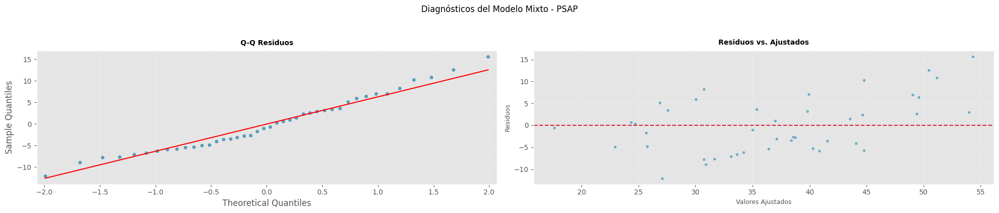


    🔍 ANÁLISIS DE SENSIBILIDAD - PSAP
    ▪ Modelo mixto: β = -14.03 (IC95% -19.78--8.29, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-21.94, -10.75]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.18, -1.53]

    ⚠ ADVERTENCIAS:
    - 22/38 pacientes excluidos (57.9%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


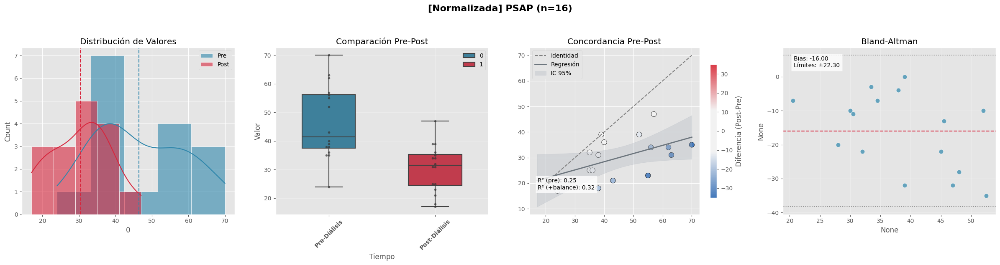


    📊 ANÁLISIS ESTADÍSTICO - PSAP
    ▪ Diferencia media (IC 95%) [Estandarizada]: -1.21 (-1.67 a -0.75)
    ▪ Diferencia media (IC 95%) [Original]: -16.00 (-21.58 a -10.42)
    ▪ Prueba de normalidad: W = 0.925, p = 0.2004
    ▪ Prueba seleccionada: t(15) = 5.62, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -1.41
    ▪ R² (solo pre): 0.246
    ▪ R² (pre + balance): 0.316
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en PSAP: 7 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


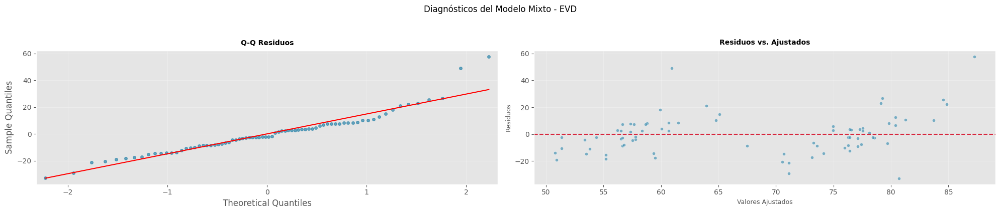


    🔍 ANÁLISIS DE SENSIBILIDAD - EVD
    ▪ Modelo mixto: β = -19.76 (IC95% -27.08--12.45, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-26.57, -12.50]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.24, -1.60]
────────────────────────────────────────────────────────────────────────────────


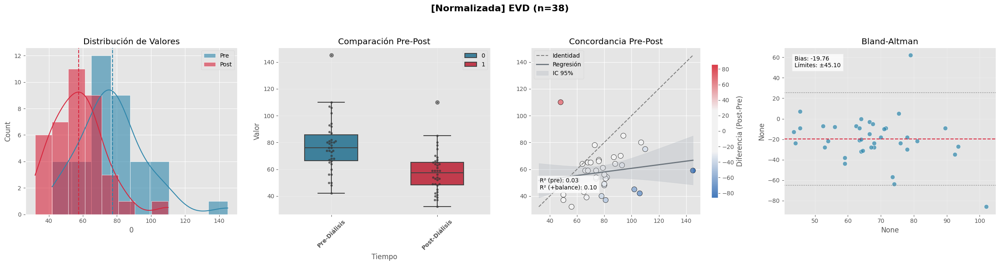


    📊 ANÁLISIS ESTADÍSTICO - EVD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.98 (-1.35 a -0.60)
    ▪ Diferencia media (IC 95%) [Original]: -19.76 (-27.08 a -12.45)
    ▪ Prueba de normalidad: W = 0.891, p = 0.0014
    ▪ Prueba seleccionada: Z = -4.778, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -0.86
    ▪ R² (solo pre): 0.030
    ▪ R² (pre + balance): 0.098
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en EVD: 13 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


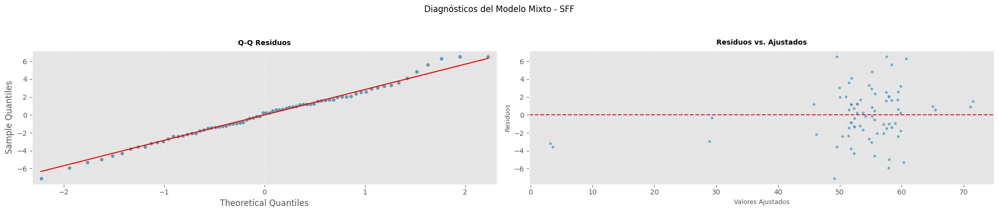


    🔍 ANÁLISIS DE SENSIBILIDAD - SFF
    ▪ Modelo mixto: β = -0.39 (IC95% -2.17-1.38, p=0.6629)
    ▪ Bootstrapping BCa (IC95%): [-2.24, 1.22]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.16, -1.58]
────────────────────────────────────────────────────────────────────────────────


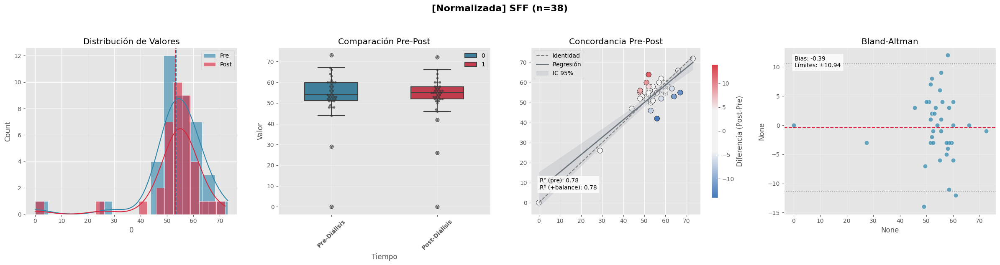


    📊 ANÁLISIS ESTADÍSTICO - SFF
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.03 (-0.20 a 0.13)
    ▪ Diferencia media (IC 95%) [Original]: -0.39 (-2.17 a 1.38)
    ▪ Prueba de normalidad: W = 0.981, p = 0.7467
    ▪ Prueba seleccionada: t(37) = 0.44, p = 0.6655
    ▪ Tamaño del efecto (Cohen's d): -0.07
    ▪ R² (solo pre): 0.777
    ▪ R² (pre + balance): 0.779
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en SFF: 1572 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


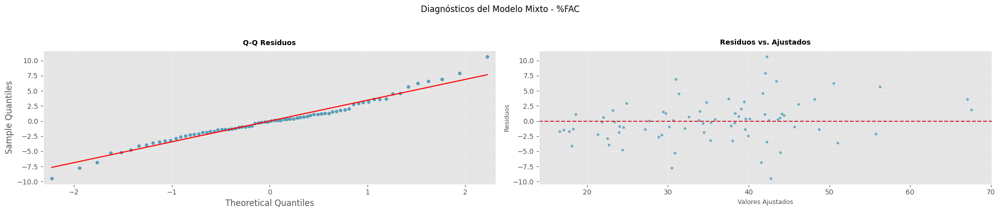


    🔍 ANÁLISIS DE SENSIBILIDAD - %FAC
    ▪ Modelo mixto: β = 0.50 (IC95% -1.63-2.63, p=0.6440)
    ▪ Bootstrapping BCa (IC95%): [-1.72, 2.68]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.12, -1.56]
────────────────────────────────────────────────────────────────────────────────


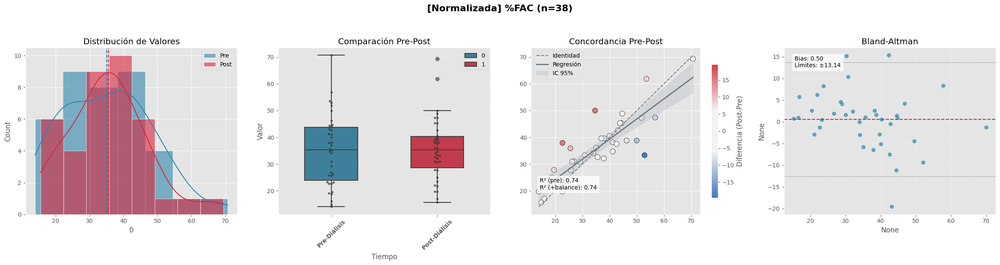


    📊 ANÁLISIS ESTADÍSTICO - %FAC
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.04 (-0.14 a 0.22)
    ▪ Diferencia media (IC 95%) [Original]: 0.50 (-1.63 a 2.63)
    ▪ Prueba de normalidad: W = 0.961, p = 0.2077
    ▪ Prueba seleccionada: t(37) = -0.46, p = 0.6467
    ▪ Tamaño del efecto (Cohen's d): 0.07
    ▪ R² (solo pre): 0.743
    ▪ R² (pre + balance): 0.744
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en %fac: 1399 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


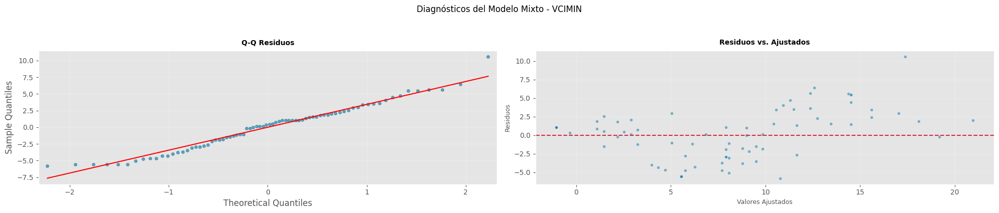


    🔍 ANÁLISIS DE SENSIBILIDAD - VCIMIN
    ▪ Modelo mixto: β = -6.61 (IC95% -8.56--4.65, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-8.56, -4.82]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.07, -1.59]
────────────────────────────────────────────────────────────────────────────────


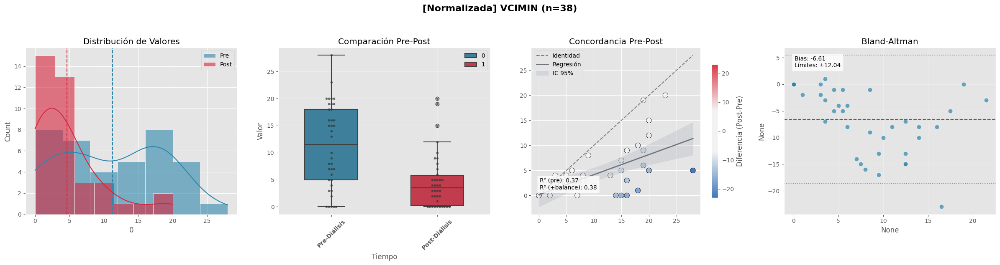


    📊 ANÁLISIS ESTADÍSTICO - VCIMIN
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.91 (-1.19 a -0.63)
    ▪ Diferencia media (IC 95%) [Original]: -6.61 (-8.56 a -4.65)
    ▪ Prueba de normalidad: W = 0.913, p = 0.0063
    ▪ Prueba seleccionada: Z = -5.337, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -1.07
    ▪ R² (solo pre): 0.371
    ▪ R² (pre + balance): 0.377
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VCImin: 9 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


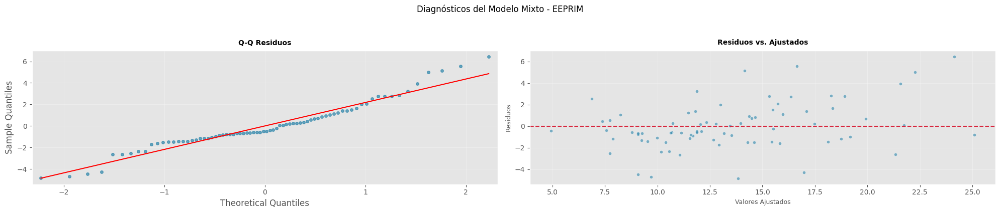


    🔍 ANÁLISIS DE SENSIBILIDAD - EEPRIM
    ▪ Modelo mixto: β = -2.82 (IC95% -4.12--1.52, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-4.16, -1.55]
────────────────────────────────────────────────────────────────────────────────


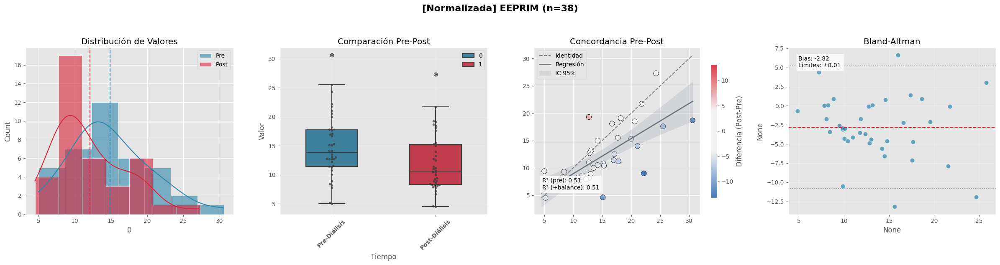


    📊 ANÁLISIS ESTADÍSTICO - EEPRIM
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.52 (-0.76 a -0.27)
    ▪ Diferencia media (IC 95%) [Original]: -2.82 (-4.12 a -1.52)
    ▪ Prueba de normalidad: W = 0.971, p = 0.4276
    ▪ Prueba seleccionada: t(37) = 4.25, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.69
    ▪ R² (solo pre): 0.505
    ▪ R² (pre + balance): 0.505
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Eeprim: 19 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


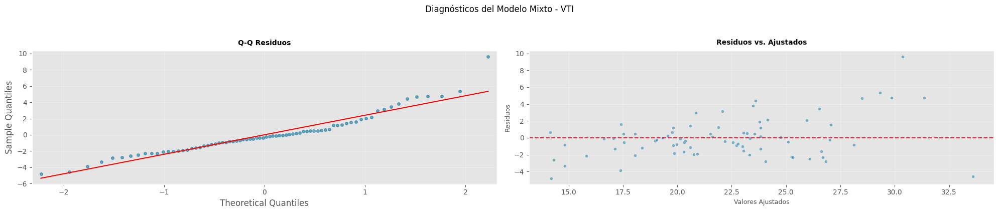


    🔍 ANÁLISIS DE SENSIBILIDAD - VTI
    ▪ Modelo mixto: β = -3.23 (IC95% -4.64--1.82, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-4.64, -1.87]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.03, -1.51]
────────────────────────────────────────────────────────────────────────────────


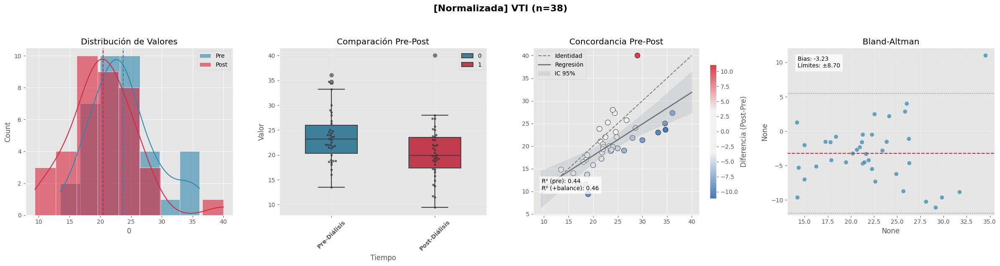


    📊 ANÁLISIS ESTADÍSTICO - VTI
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.58 (-0.84 a -0.32)
    ▪ Diferencia media (IC 95%) [Original]: -3.23 (-4.64 a -1.82)
    ▪ Prueba de normalidad: W = 0.958, p = 0.1667
    ▪ Prueba seleccionada: t(37) = 4.48, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.73
    ▪ R² (solo pre): 0.439
    ▪ R² (pre + balance): 0.457
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VTI: 17 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


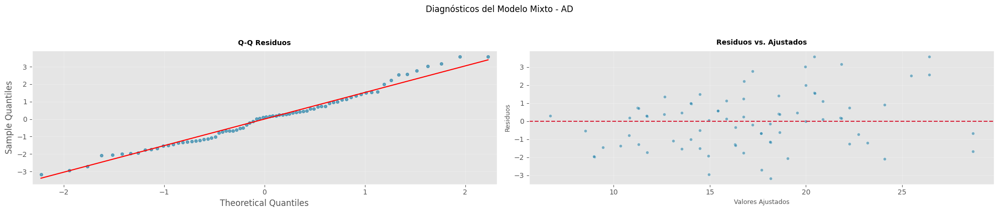


    🔍 ANÁLISIS DE SENSIBILIDAD - AD
    ▪ Modelo mixto: β = -2.26 (IC95% -3.21--1.32, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-3.24, -1.39]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.14, -1.60]
────────────────────────────────────────────────────────────────────────────────


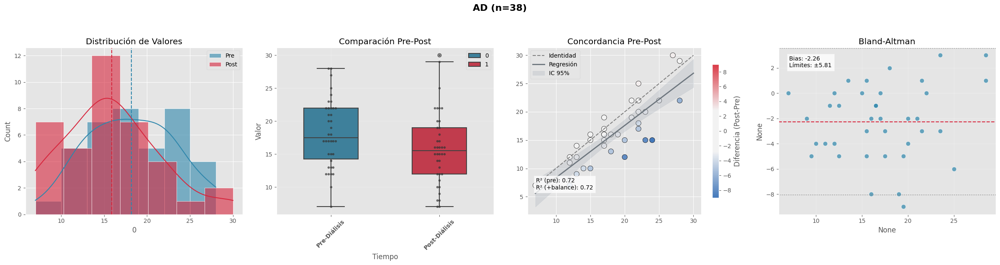


    📊 ANÁLISIS ESTADÍSTICO - AD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.42 (-0.60 a -0.24)
    ▪ Diferencia media (IC 95%) [Original]: -2.26 (-3.21 a -1.32)
    ▪ Prueba de normalidad: W = 0.972, p = 0.4390
    ▪ Prueba seleccionada: t(37) = 4.70, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -0.76
    ▪ R² (solo pre): 0.722
    ▪ R² (pre + balance): 0.723
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en AD: 16 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


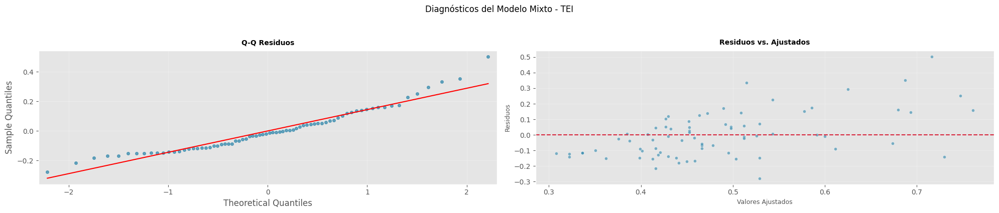


    🔍 ANÁLISIS DE SENSIBILIDAD - TEI
    ▪ Modelo mixto: β = 0.01 (IC95% -0.07-0.09, p=0.7317)
    ▪ Bootstrapping BCa (IC95%): [-0.06, 0.09]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.08, -1.63]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


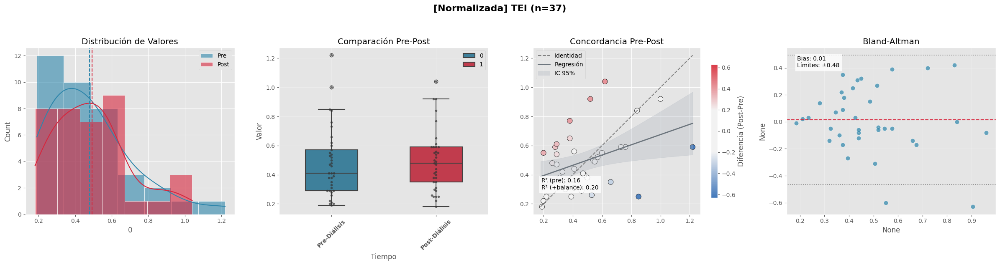


    📊 ANÁLISIS ESTADÍSTICO - TEI
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.06 (-0.31 a 0.43)
    ▪ Diferencia media (IC 95%) [Original]: 0.01 (-0.07 a 0.09)
    ▪ Prueba de normalidad: W = 0.946, p = 0.0725
    ▪ Prueba seleccionada: t(36) = -0.34, p = 0.7337
    ▪ Tamaño del efecto (Cohen's d): 0.06
    ▪ R² (solo pre): 0.159
    ▪ R² (pre + balance): 0.200
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TEI: 2472 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


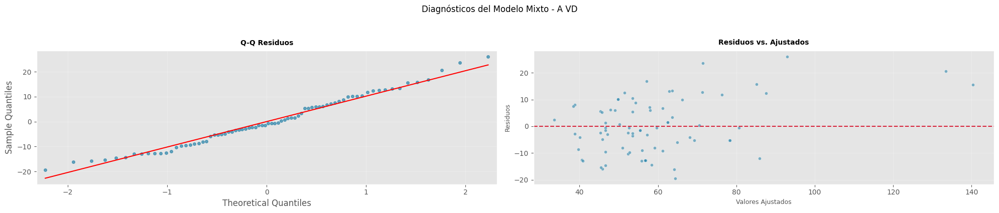


    🔍 ANÁLISIS DE SENSIBILIDAD - A VD
    ▪ Modelo mixto: β = -7.00 (IC95% -13.03--0.97, p=0.0229)
    ▪ Bootstrapping BCa (IC95%): [-13.03, -1.79]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.05, -1.54]
────────────────────────────────────────────────────────────────────────────────


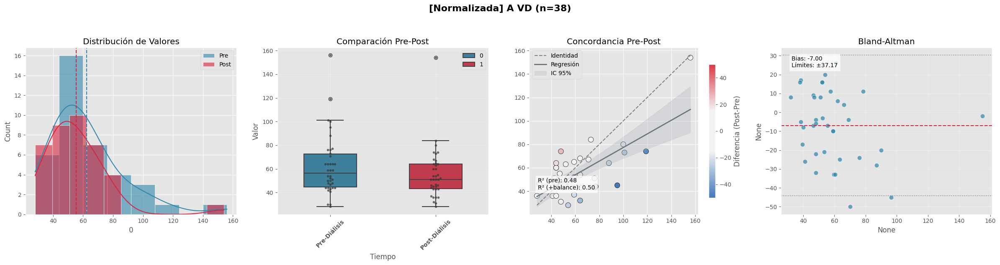


    📊 ANÁLISIS ESTADÍSTICO - A VD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.29 (-0.56 a -0.03)
    ▪ Diferencia media (IC 95%) [Original]: -7.00 (-13.03 a -0.97)
    ▪ Prueba de normalidad: W = 0.968, p = 0.3378
    ▪ Prueba seleccionada: t(37) = 2.28, p = 0.0288
    ▪ Tamaño del efecto (Cohen's d): -0.37
    ▪ R² (solo pre): 0.481
    ▪ R² (pre + balance): 0.505
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en A VD: 60 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


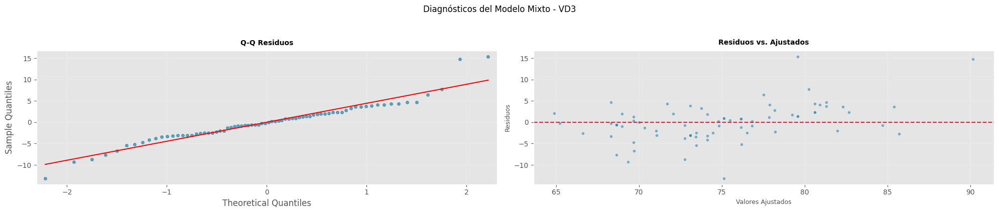


    🔍 ANÁLISIS DE SENSIBILIDAD - VD3
    ▪ Modelo mixto: β = -4.46 (IC95% -6.99--1.92, p=0.0006)
    ▪ Bootstrapping BCa (IC95%): [-7.78, -2.32]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.14, -1.65]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


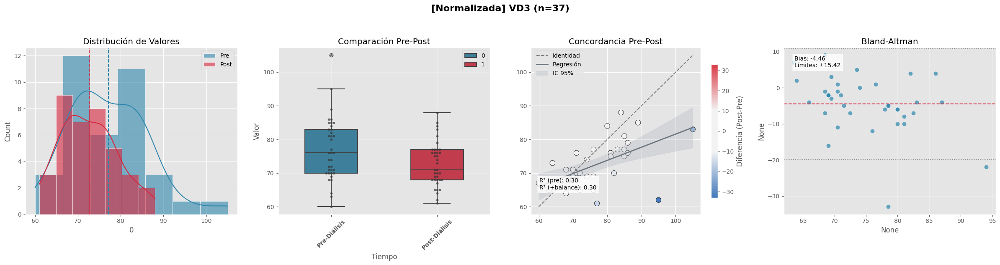


    📊 ANÁLISIS ESTADÍSTICO - VD3
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.54 (-0.86 a -0.22)
    ▪ Diferencia media (IC 95%) [Original]: -4.46 (-7.00 a -1.92)
    ▪ Prueba de normalidad: W = 0.901, p = 0.0032
    ▪ Prueba seleccionada: Z = -3.462, p = 0.0009
    ▪ Tamaño del efecto (Cohen's d): -0.57
    ▪ R² (solo pre): 0.300
    ▪ R² (pre + balance): 0.303
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VD3: 27 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


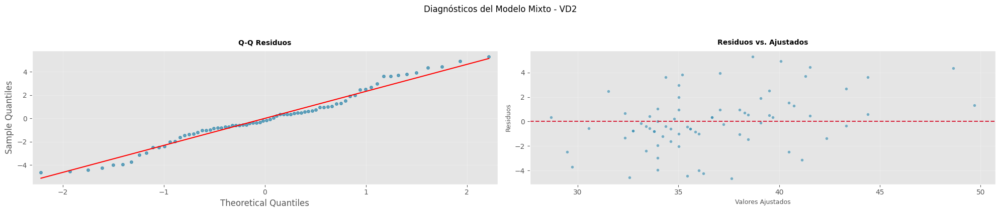


    🔍 ANÁLISIS DE SENSIBILIDAD - VD2
    ▪ Modelo mixto: β = -1.05 (IC95% -2.45-0.34, p=0.1378)
    ▪ Bootstrapping BCa (IC95%): [-2.47, 0.30]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.16, -1.60]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


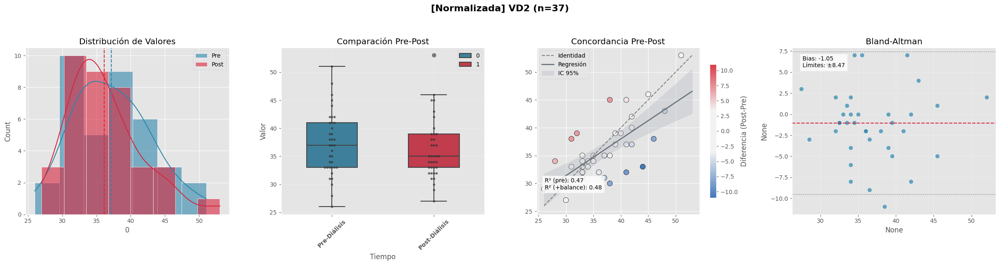


    📊 ANÁLISIS ESTADÍSTICO - VD2
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.19 (-0.46 a 0.07)
    ▪ Diferencia media (IC 95%) [Original]: -1.05 (-2.45 a 0.34)
    ▪ Prueba de normalidad: W = 0.969, p = 0.3886
    ▪ Prueba seleccionada: t(36) = 1.48, p = 0.1465
    ▪ Tamaño del efecto (Cohen's d): -0.24
    ▪ R² (solo pre): 0.474
    ▪ R² (pre + balance): 0.477
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VD2: 134 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


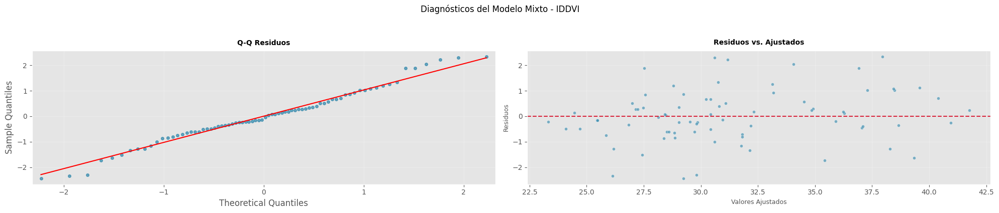


    🔍 ANÁLISIS DE SENSIBILIDAD - IDDVI
    ▪ Modelo mixto: β = -1.38 (IC95% -2.02--0.73, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-2.03, -0.80]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.12, -1.49]
────────────────────────────────────────────────────────────────────────────────


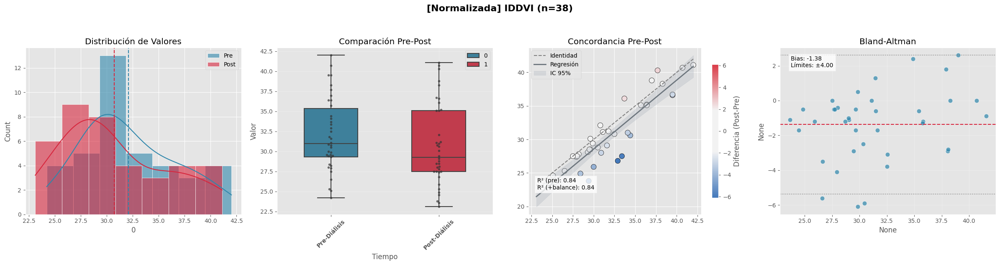


    📊 ANÁLISIS ESTADÍSTICO - IDDVI
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.29 (-0.43 a -0.15)
    ▪ Diferencia media (IC 95%) [Original]: -1.38 (-2.02 a -0.73)
    ▪ Prueba de normalidad: W = 0.952, p = 0.1072
    ▪ Prueba seleccionada: t(37) = 4.16, p = 0.0002
    ▪ Tamaño del efecto (Cohen's d): -0.67
    ▪ R² (solo pre): 0.841
    ▪ R² (pre + balance): 0.843
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en IDDVI: 20 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


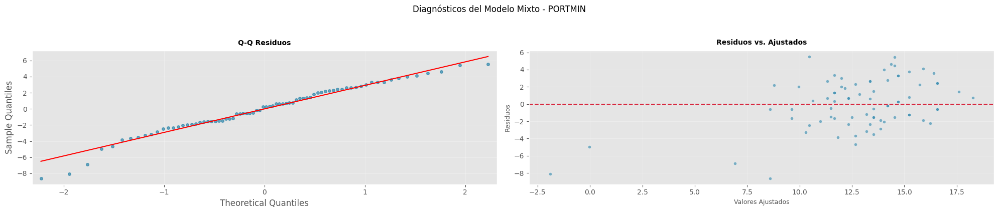


    🔍 ANÁLISIS DE SENSIBILIDAD - PORTMIN
    ▪ Modelo mixto: β = 1.87 (IC95% 0.23-3.51, p=0.0252)
    ▪ Bootstrapping BCa (IC95%): [0.23, 3.44]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.08, -1.54]
────────────────────────────────────────────────────────────────────────────────


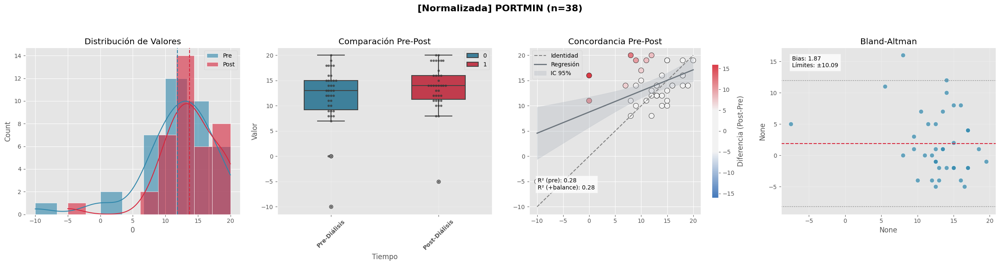


    📊 ANÁLISIS ESTADÍSTICO - PORTMIN
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.36 (0.03 a 0.68)
    ▪ Diferencia media (IC 95%) [Original]: 1.87 (0.23 a 3.51)
    ▪ Prueba de normalidad: W = 0.929, p = 0.0188
    ▪ Prueba seleccionada: Z = -2.190, p = 0.1173
    ▪ Tamaño del efecto (Cohen's d): 0.36
    ▪ R² (solo pre): 0.277
    ▪ R² (pre + balance): 0.277
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Portmin: 62 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


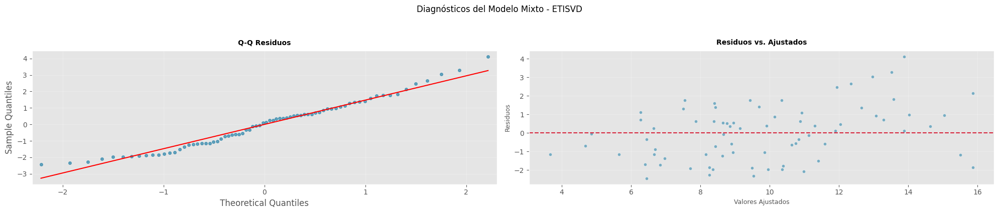


    🔍 ANÁLISIS DE SENSIBILIDAD - ETISVD
    ▪ Modelo mixto: β = -1.98 (IC95% -2.87--1.10, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-2.82, -1.13]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.12, -1.65]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


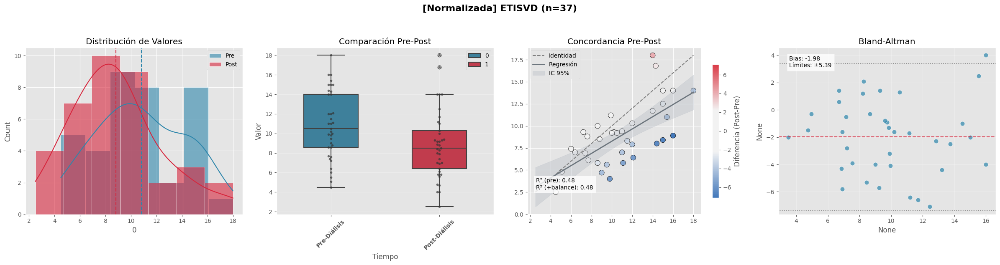


    📊 ANÁLISIS ESTADÍSTICO - ETISVD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.55 (-0.81 a -0.30)
    ▪ Diferencia media (IC 95%) [Original]: -1.98 (-2.87 a -1.10)
    ▪ Prueba de normalidad: W = 0.983, p = 0.8152
    ▪ Prueba seleccionada: t(36) = 4.39, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.72
    ▪ R² (solo pre): 0.478
    ▪ R² (pre + balance): 0.483
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en EtisVD: 18 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


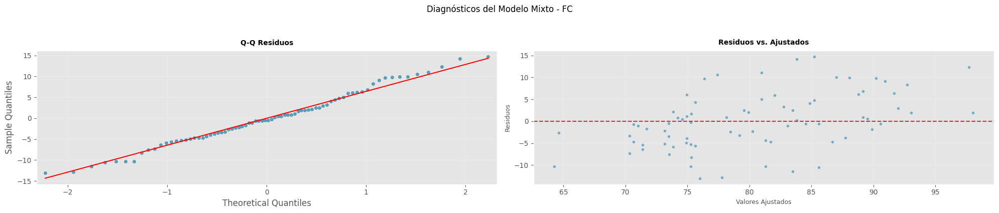


    🔍 ANÁLISIS DE SENSIBILIDAD - FC
    ▪ Modelo mixto: β = 0.34 (IC95% -3.31-3.99, p=0.8543)
    ▪ Bootstrapping BCa (IC95%): [-3.47, 3.71]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.31, -1.58]
────────────────────────────────────────────────────────────────────────────────


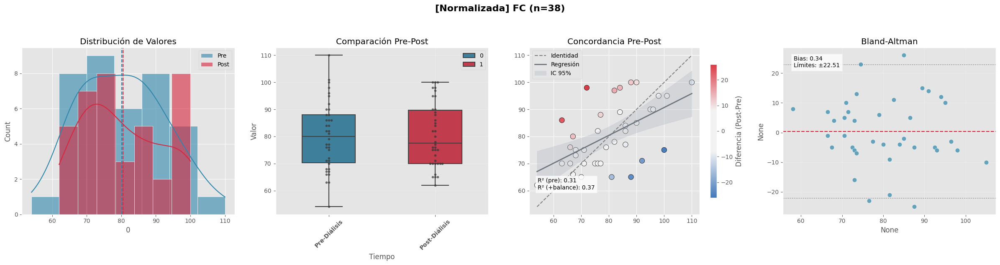


    📊 ANÁLISIS ESTADÍSTICO - FC
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.03 (-0.29 a 0.34)
    ▪ Diferencia media (IC 95%) [Original]: 0.34 (-3.31 a 3.99)
    ▪ Prueba de normalidad: W = 0.973, p = 0.4793
    ▪ Prueba seleccionada: t(37) = -0.18, p = 0.8553
    ▪ Tamaño del efecto (Cohen's d): 0.03
    ▪ R² (solo pre): 0.306
    ▪ R² (pre + balance): 0.372
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en FC: 8849 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


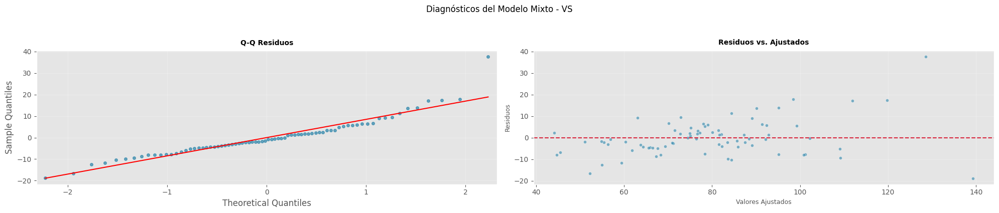


    🔍 ANÁLISIS DE SENSIBILIDAD - VS
    ▪ Modelo mixto: β = -10.76 (IC95% -15.86--5.66, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-15.31, -5.23]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.16, -1.55]
────────────────────────────────────────────────────────────────────────────────


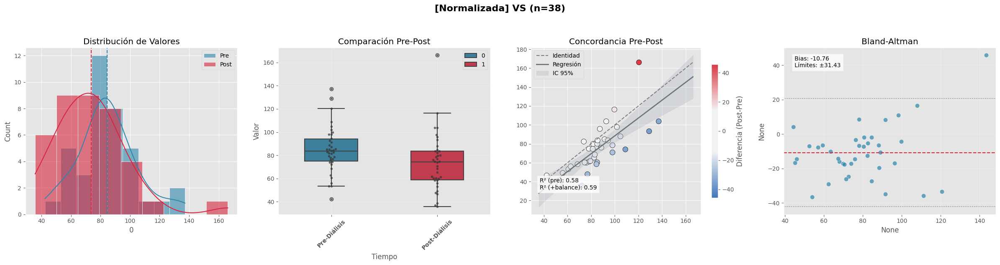


    📊 ANÁLISIS ESTADÍSTICO - VS
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.47 (-0.70 a -0.24)
    ▪ Diferencia media (IC 95%) [Original]: -10.76 (-15.86 a -5.66)
    ▪ Prueba de normalidad: W = 0.927, p = 0.0167
    ▪ Prueba seleccionada: Z = -3.792, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.67
    ▪ R² (solo pre): 0.580
    ▪ R² (pre + balance): 0.594
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VS: 20 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


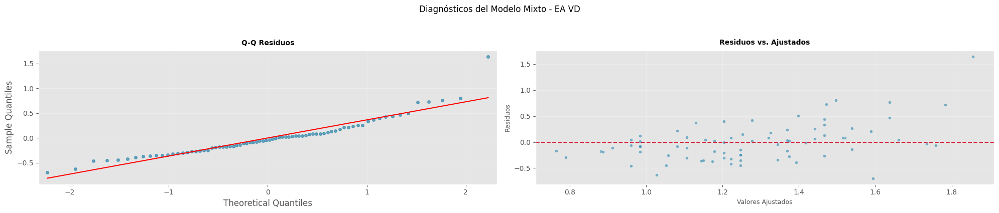


    🔍 ANÁLISIS DE SENSIBILIDAD - EA VD
    ▪ Modelo mixto: β = -0.26 (IC95% -0.45--0.07, p=0.0071)
    ▪ Bootstrapping BCa (IC95%): [-0.50, -0.11]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.07, -1.64]
────────────────────────────────────────────────────────────────────────────────


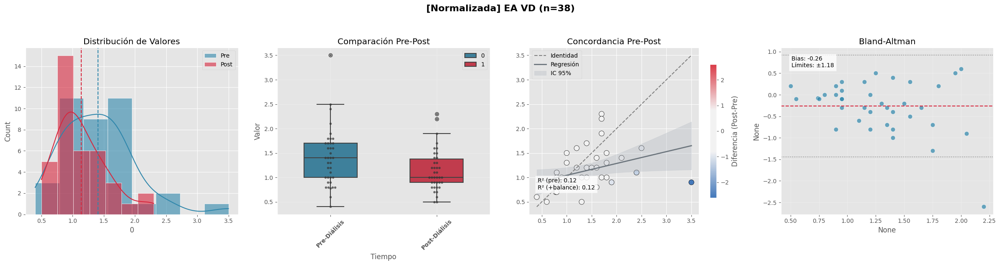


    📊 ANÁLISIS ESTADÍSTICO - EA VD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.50 (-0.87 a -0.12)
    ▪ Diferencia media (IC 95%) [Original]: -0.26 (-0.45 a -0.07)
    ▪ Prueba de normalidad: W = 0.886, p = 0.0011
    ▪ Prueba seleccionada: Z = -2.958, p = 0.0149
    ▪ Tamaño del efecto (Cohen's d): -0.44
    ▪ R² (solo pre): 0.117
    ▪ R² (pre + balance): 0.118
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en EA VD: 44 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


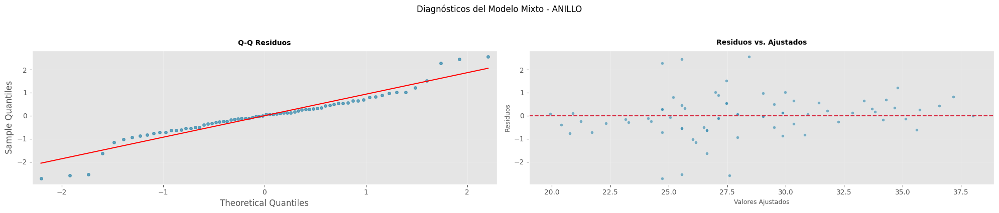


    🔍 ANÁLISIS DE SENSIBILIDAD - ANILLO
    ▪ Modelo mixto: β = -0.83 (IC95% -1.44--0.23, p=0.0072)
    ▪ Bootstrapping BCa (IC95%): [-1.47, -0.25]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.11, -1.57]

    ⚠ ADVERTENCIAS:
    - 2/38 pacientes excluidos (5.3%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


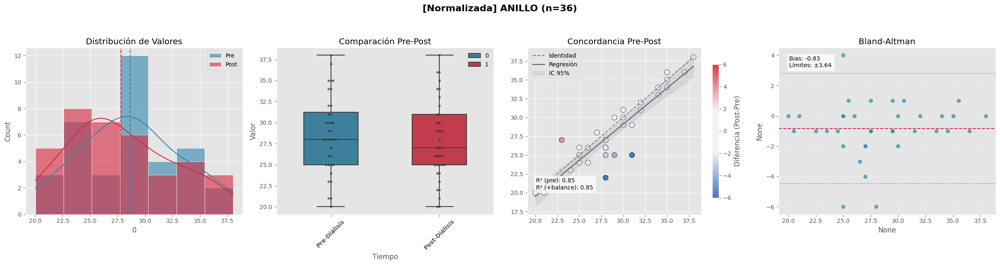


    📊 ANÁLISIS ESTADÍSTICO - ANILLO
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.18 (-0.32 a -0.04)
    ▪ Diferencia media (IC 95%) [Original]: -0.83 (-1.44 a -0.23)
    ▪ Prueba de normalidad: W = 0.871, p = 0.0006
    ▪ Prueba seleccionada: Z = -3.975, p = 0.0147
    ▪ Tamaño del efecto (Cohen's d): -0.45
    ▪ R² (solo pre): 0.848
    ▪ R² (pre + balance): 0.853
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Anillo: 42 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


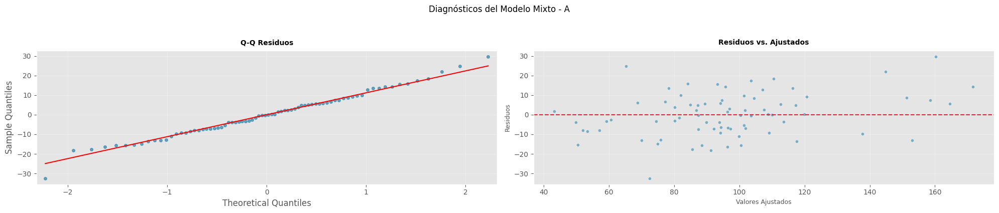


    🔍 ANÁLISIS DE SENSIBILIDAD - A
    ▪ Modelo mixto: β = -7.18 (IC95% -14.00--0.37, p=0.0389)
    ▪ Bootstrapping BCa (IC95%): [-13.93, -0.64]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.15, -1.63]
────────────────────────────────────────────────────────────────────────────────


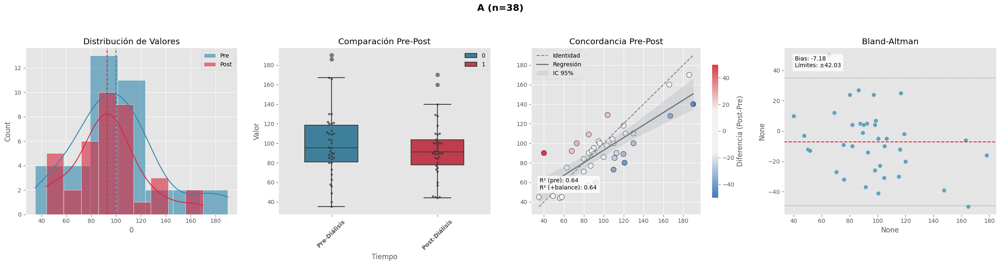


    📊 ANÁLISIS ESTADÍSTICO - A
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.22 (-0.44 a -0.00)
    ▪ Diferencia media (IC 95%) [Original]: -7.18 (-14.00 a -0.37)
    ▪ Prueba de normalidad: W = 0.983, p = 0.8322
    ▪ Prueba seleccionada: t(37) = 2.07, p = 0.0460
    ▪ Tamaño del efecto (Cohen's d): -0.34
    ▪ R² (solo pre): 0.644
    ▪ R² (pre + balance): 0.645
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en A: 72 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


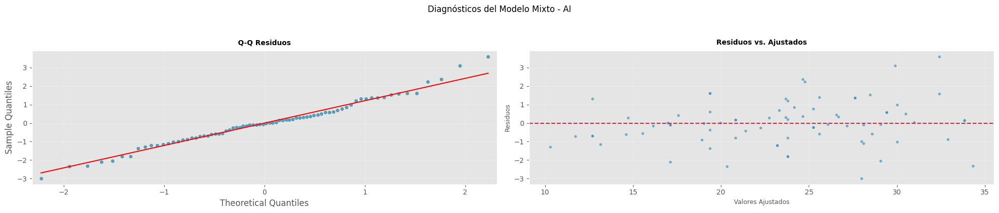


    🔍 ANÁLISIS DE SENSIBILIDAD - AI
    ▪ Modelo mixto: β = -4.42 (IC95% -5.18--3.66, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-5.24, -3.66]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.05, -1.54]
────────────────────────────────────────────────────────────────────────────────


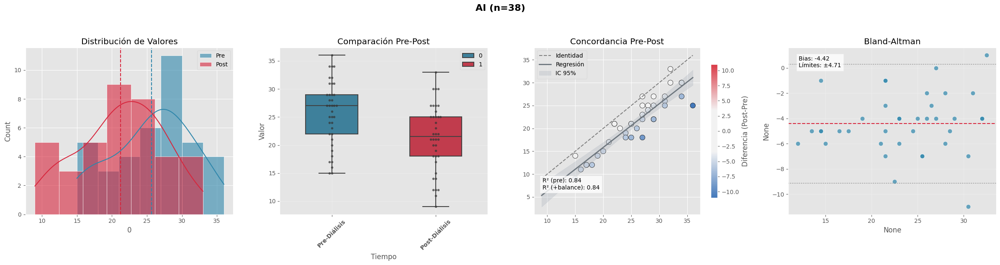


    📊 ANÁLISIS ESTADÍSTICO - AI
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.72 (-0.84 a -0.59)
    ▪ Diferencia media (IC 95%) [Original]: -4.42 (-5.18 a -3.66)
    ▪ Prueba de normalidad: W = 0.964, p = 0.2613
    ▪ Prueba seleccionada: t(37) = 11.35, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -1.84
    ▪ R² (solo pre): 0.840
    ▪ R² (pre + balance): 0.844
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en AI: 5 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


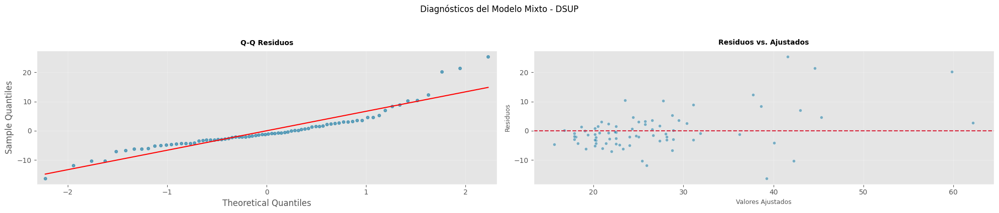


    🔍 ANÁLISIS DE SENSIBILIDAD - DSUP
    ▪ Modelo mixto: β = 2.37 (IC95% -1.47-6.20, p=0.2263)
    ▪ Bootstrapping BCa (IC95%): [-0.72, 7.03]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.13, -1.66]
────────────────────────────────────────────────────────────────────────────────


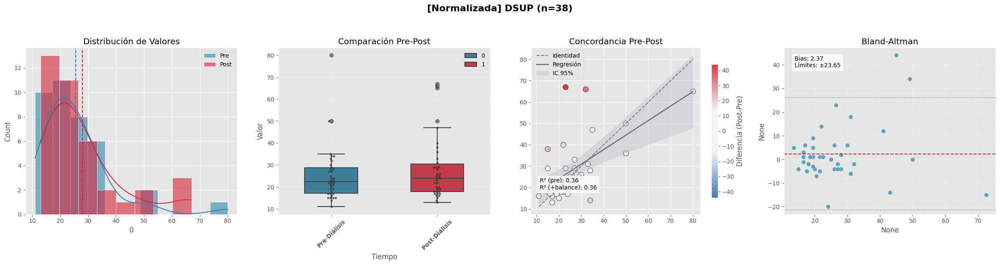


    📊 ANÁLISIS ESTADÍSTICO - DSUP
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.18 (-0.12 a 0.47)
    ▪ Diferencia media (IC 95%) [Original]: 2.37 (-1.47 a 6.20)
    ▪ Prueba de normalidad: W = 0.863, p = 0.0003
    ▪ Prueba seleccionada: Z = -1.044, p = 0.5876
    ▪ Tamaño del efecto (Cohen's d): 0.20
    ▪ R² (solo pre): 0.363
    ▪ R² (pre + balance): 0.364
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Dsup: 206 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


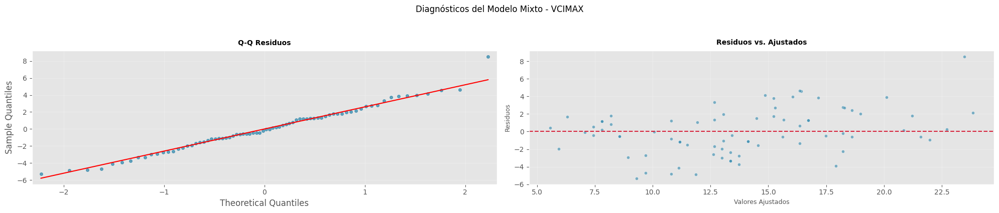


    🔍 ANÁLISIS DE SENSIBILIDAD - VCIMAX
    ▪ Modelo mixto: β = -5.55 (IC95% -7.05--4.05, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-7.18, -4.13]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.09, -1.55]
────────────────────────────────────────────────────────────────────────────────


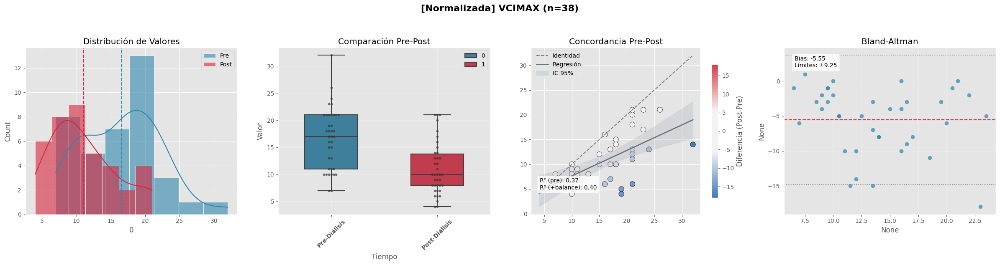


    📊 ANÁLISIS ESTADÍSTICO - VCIMAX
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.94 (-1.21 a -0.68)
    ▪ Diferencia media (IC 95%) [Original]: -5.55 (-7.05 a -4.05)
    ▪ Prueba de normalidad: W = 0.923, p = 0.0120
    ▪ Prueba seleccionada: Z = -5.351, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -1.18
    ▪ R² (solo pre): 0.367
    ▪ R² (pre + balance): 0.401
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VCImax: 8 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


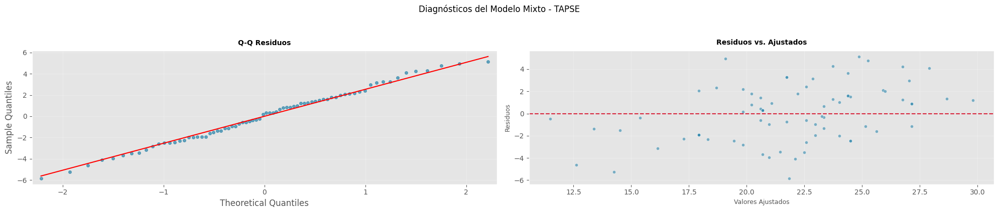


    🔍 ANÁLISIS DE SENSIBILIDAD - TAPSE
    ▪ Modelo mixto: β = -2.76 (IC95% -4.24--1.27, p=0.0003)
    ▪ Bootstrapping BCa (IC95%): [-4.22, -1.24]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.20, -1.64]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


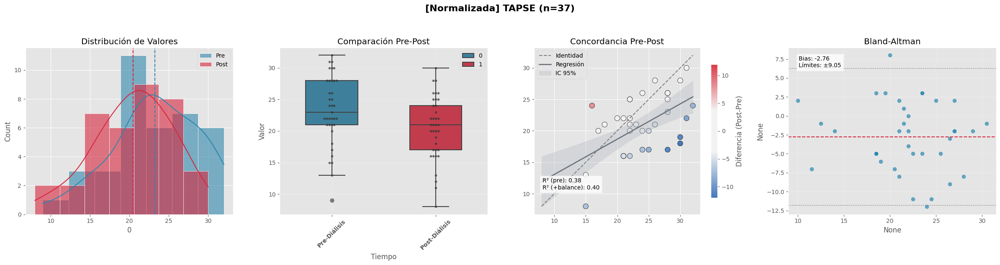


    📊 ANÁLISIS ESTADÍSTICO - TAPSE
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.52 (-0.80 a -0.23)
    ▪ Diferencia media (IC 95%) [Original]: -2.76 (-4.24 a -1.27)
    ▪ Prueba de normalidad: W = 0.974, p = 0.5302
    ▪ Prueba seleccionada: t(36) = 3.63, p = 0.0009
    ▪ Tamaño del efecto (Cohen's d): -0.60
    ▪ R² (solo pre): 0.376
    ▪ R² (pre + balance): 0.399
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TAPSE: 24 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


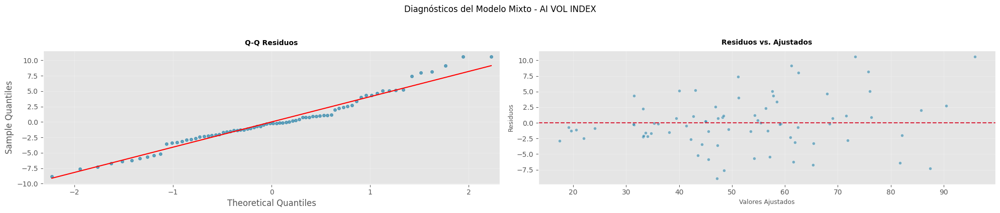


    🔍 ANÁLISIS DE SENSIBILIDAD - AI VOL INDEX
    ▪ Modelo mixto: β = -14.11 (IC95% -16.69--11.54, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-16.64, -11.62]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.15, -1.48]
────────────────────────────────────────────────────────────────────────────────


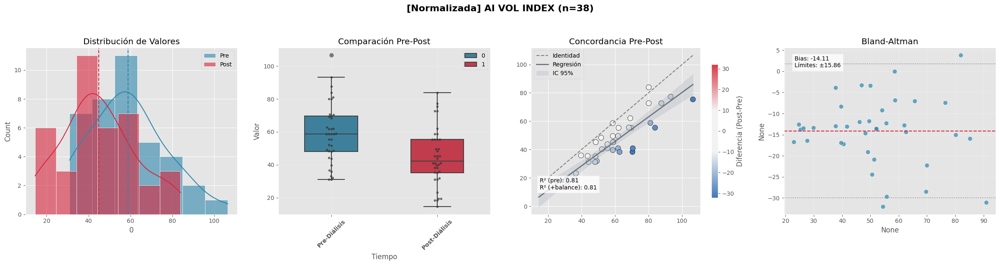


    📊 ANÁLISIS ESTADÍSTICO - AI VOL INDEX
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.74 (-0.88 a -0.60)
    ▪ Diferencia media (IC 95%) [Original]: -14.11 (-16.69 a -11.54)
    ▪ Prueba de normalidad: W = 0.957, p = 0.1486
    ▪ Prueba seleccionada: t(37) = 10.75, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -1.74
    ▪ R² (solo pre): 0.806
    ▪ R² (pre + balance): 0.809
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en AI vol index: 5 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


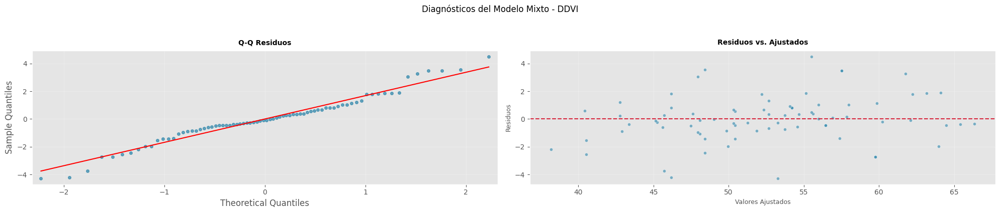


    🔍 ANÁLISIS DE SENSIBILIDAD - DDVI
    ▪ Modelo mixto: β = -2.24 (IC95% -3.29--1.18, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-3.32, -1.26]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.25, -1.58]
────────────────────────────────────────────────────────────────────────────────


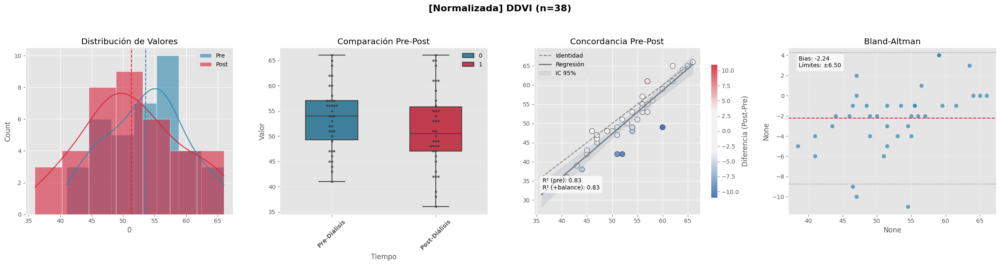


    📊 ANÁLISIS ESTADÍSTICO - DDVI
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.32 (-0.47 a -0.16)
    ▪ Diferencia media (IC 95%) [Original]: -2.24 (-3.29 a -1.18)
    ▪ Prueba de normalidad: W = 0.941, p = 0.0445
    ▪ Prueba seleccionada: Z = -4.075, p = 0.0004
    ▪ Tamaño del efecto (Cohen's d): -0.67
    ▪ R² (solo pre): 0.831
    ▪ R² (pre + balance): 0.832
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en DDVI: 20 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


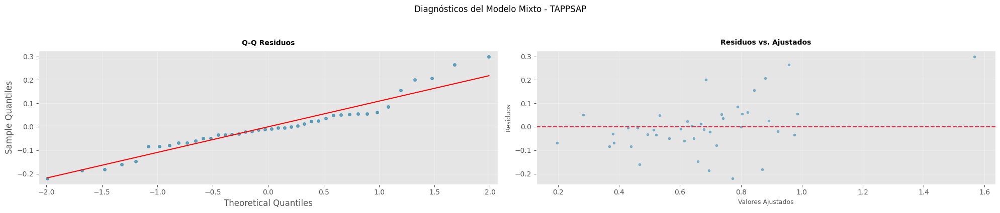


    🔍 ANÁLISIS DE SENSIBILIDAD - TAPPSAP
    ▪ Modelo mixto: β = 0.19 (IC95% 0.08-0.29, p=0.0009)
    ▪ Bootstrapping BCa (IC95%): [0.10, 0.32]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.19, -1.58]

    ⚠ ADVERTENCIAS:
    - 22/38 pacientes excluidos (57.9%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


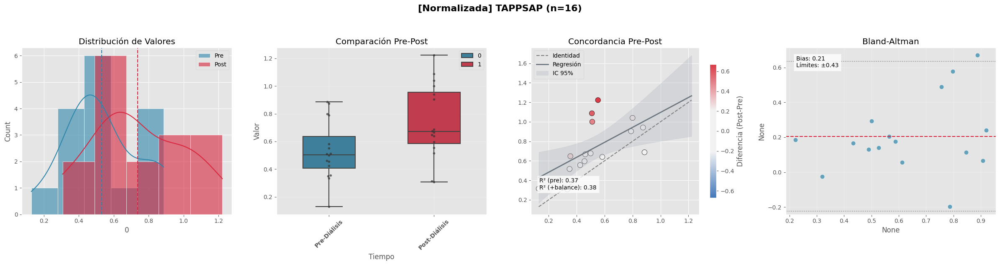


    📊 ANÁLISIS ESTADÍSTICO - TAPPSAP
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.67 (0.29 a 1.06)
    ▪ Diferencia media (IC 95%) [Original]: 0.21 (0.10 a 0.31)
    ▪ Prueba de normalidad: W = 0.929, p = 0.2308
    ▪ Prueba seleccionada: t(15) = -3.74, p = 0.0020
    ▪ Tamaño del efecto (Cohen's d): 0.94
    ▪ R² (solo pre): 0.367
    ▪ R² (pre + balance): 0.384
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TapPsap: 12 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


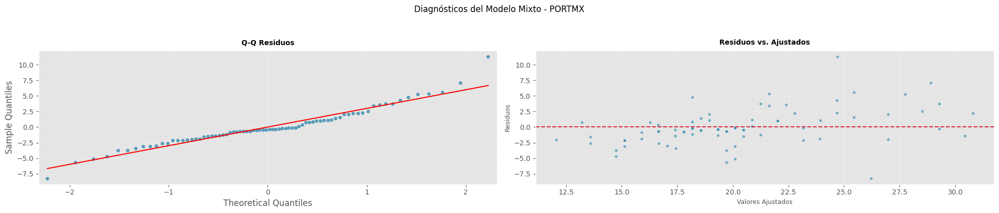


    🔍 ANÁLISIS DE SENSIBILIDAD - PORTMX
    ▪ Modelo mixto: β = -1.53 (IC95% -3.26-0.21, p=0.0846)
    ▪ Bootstrapping BCa (IC95%): [-3.13, 0.32]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.12, -1.54]
────────────────────────────────────────────────────────────────────────────────


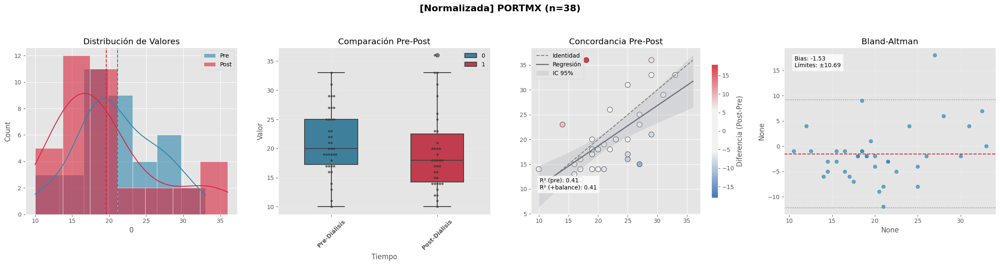


    📊 ANÁLISIS ESTADÍSTICO - PORTMX
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.25 (-0.53 a 0.04)
    ▪ Diferencia media (IC 95%) [Original]: -1.53 (-3.26 a 0.21)
    ▪ Prueba de normalidad: W = 0.901, p = 0.0027
    ▪ Prueba seleccionada: Z = -2.545, p = 0.0182
    ▪ Tamaño del efecto (Cohen's d): -0.28
    ▪ R² (solo pre): 0.407
    ▪ R² (pre + balance): 0.407
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Portmx: 103 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


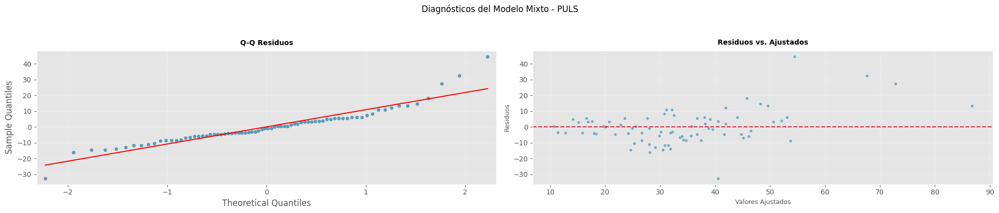


    🔍 ANÁLISIS DE SENSIBILIDAD - PULS
    ▪ Modelo mixto: β = -13.95 (IC95% -20.08--7.82, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-22.45, -9.34]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.22, -1.57]
────────────────────────────────────────────────────────────────────────────────


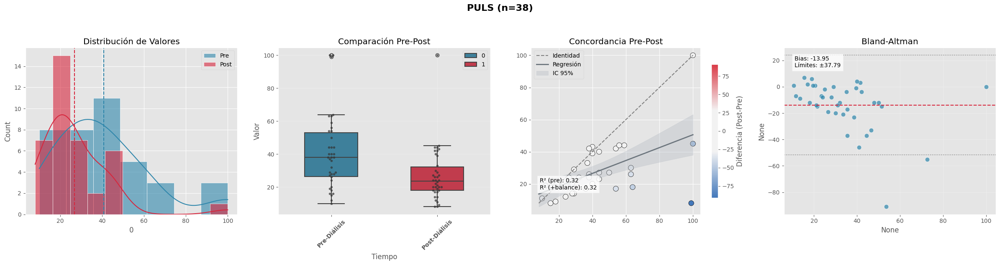


    📊 ANÁLISIS ESTADÍSTICO - PULS
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.67 (-0.97 a -0.36)
    ▪ Diferencia media (IC 95%) [Original]: -13.95 (-20.08 a -7.82)
    ▪ Prueba de normalidad: W = 0.803, p = 0.0000
    ▪ Prueba seleccionada: Z = -4.583, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -0.72
    ▪ R² (solo pre): 0.317
    ▪ R² (pre + balance): 0.323
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Puls: 18 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


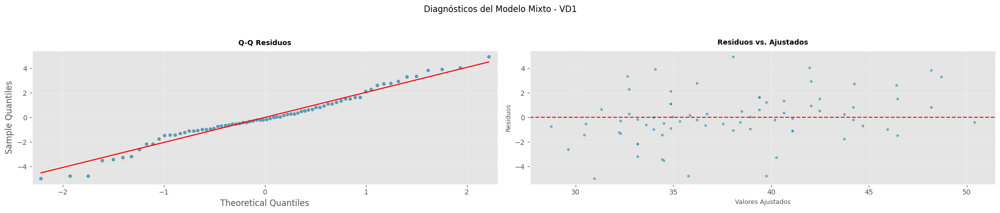


    🔍 ANÁLISIS DE SENSIBILIDAD - VD1
    ▪ Modelo mixto: β = -1.70 (IC95% -2.96--0.44, p=0.0082)
    ▪ Bootstrapping BCa (IC95%): [-2.85, -0.43]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.14, -1.54]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


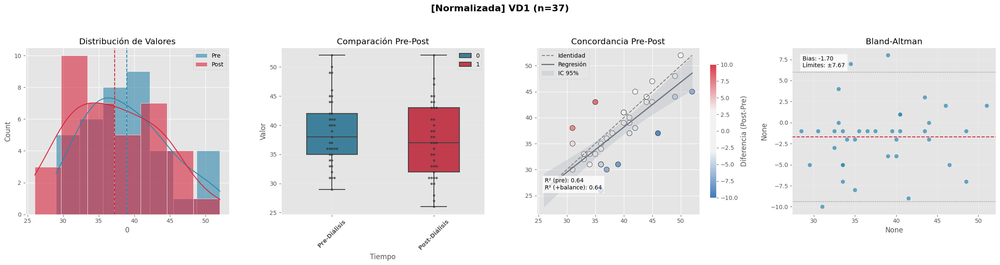


    📊 ANÁLISIS ESTADÍSTICO - VD1
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.28 (-0.49 a -0.07)
    ▪ Diferencia media (IC 95%) [Original]: -1.70 (-2.96 a -0.44)
    ▪ Prueba de normalidad: W = 0.958, p = 0.1796
    ▪ Prueba seleccionada: t(36) = 2.65, p = 0.0120
    ▪ Tamaño del efecto (Cohen's d): -0.43
    ▪ R² (solo pre): 0.638
    ▪ R² (pre + balance): 0.640
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en VD1: 44 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


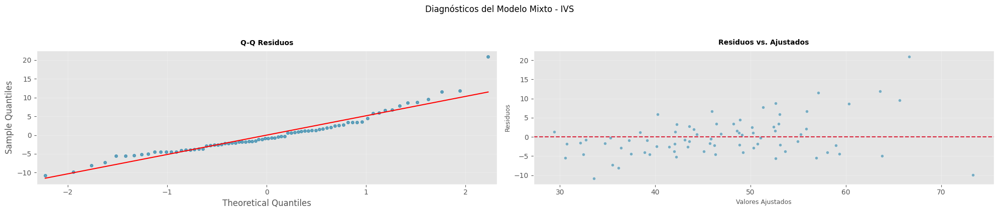


    🔍 ANÁLISIS DE SENSIBILIDAD - IVS
    ▪ Modelo mixto: β = -6.71 (IC95% -9.76--3.67, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-9.42, -3.36]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.36, -1.60]
────────────────────────────────────────────────────────────────────────────────


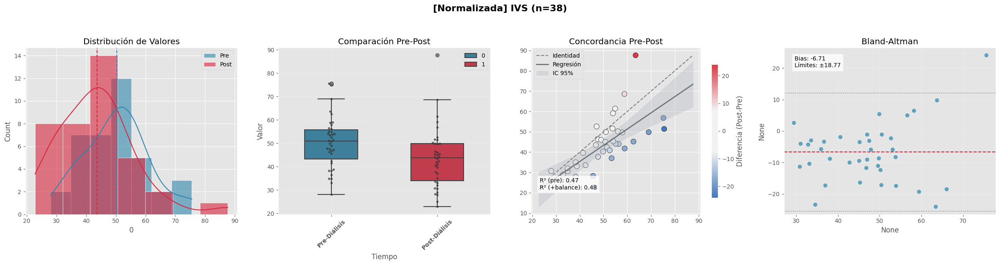


    📊 ANÁLISIS ESTADÍSTICO - IVS
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.55 (-0.81 a -0.29)
    ▪ Diferencia media (IC 95%) [Original]: -6.71 (-9.76 a -3.67)
    ▪ Prueba de normalidad: W = 0.957, p = 0.1562
    ▪ Prueba seleccionada: t(37) = 4.32, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.70
    ▪ R² (solo pre): 0.466
    ▪ R² (pre + balance): 0.483
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en IVS: 19 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


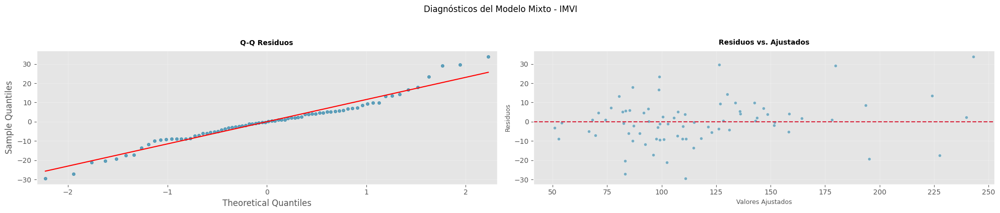


    🔍 ANÁLISIS DE SENSIBILIDAD - IMVI
    ▪ Modelo mixto: β = -15.59 (IC95% -22.79--8.40, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-23.27, -9.12]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.13, -1.62]
────────────────────────────────────────────────────────────────────────────────


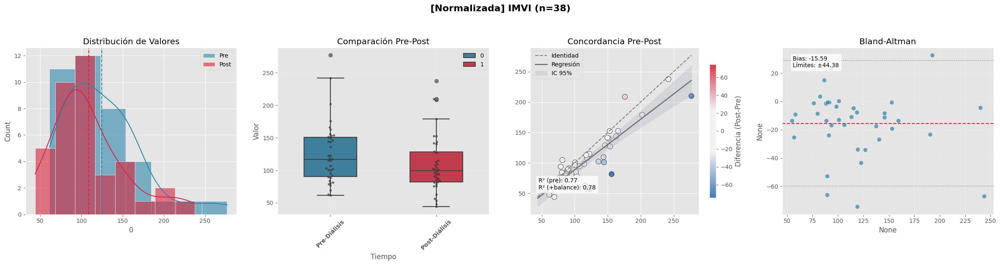


    📊 ANÁLISIS ESTADÍSTICO - IMVI
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.34 (-0.50 a -0.18)
    ▪ Diferencia media (IC 95%) [Original]: -15.59 (-22.79 a -8.40)
    ▪ Prueba de normalidad: W = 0.922, p = 0.0115
    ▪ Prueba seleccionada: Z = -4.126, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -0.69
    ▪ R² (solo pre): 0.773
    ▪ R² (pre + balance): 0.785
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en IMVI: 19 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


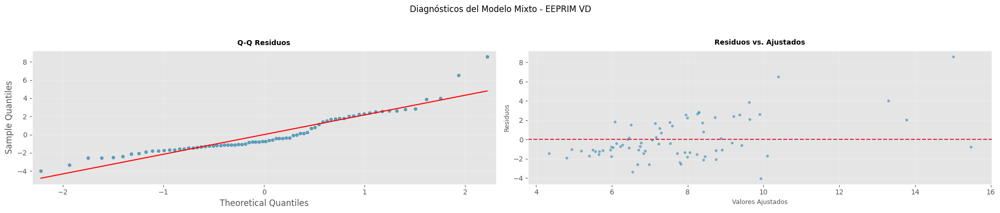


    🔍 ANÁLISIS DE SENSIBILIDAD - EEPRIM VD
    ▪ Modelo mixto: β = -0.47 (IC95% -1.69-0.75, p=0.4529)
    ▪ Bootstrapping BCa (IC95%): [-1.63, 0.73]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.20, -1.66]

    ⚠ ADVERTENCIAS:
    - 1/38 pacientes excluidos (2.6%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


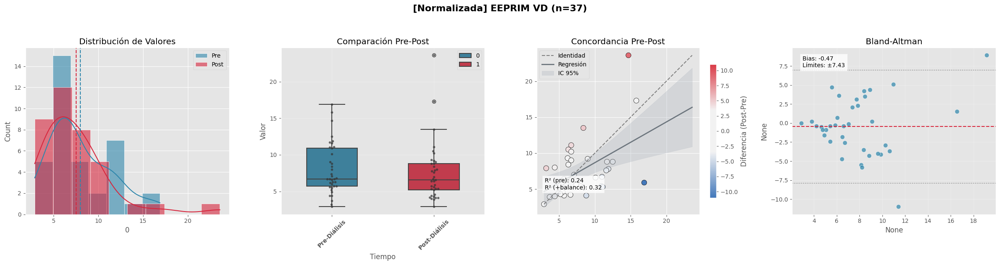


    📊 ANÁLISIS ESTADÍSTICO - EEPRIM VD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.13 (-0.47 a 0.21)
    ▪ Diferencia media (IC 95%) [Original]: -0.47 (-1.69 a 0.75)
    ▪ Prueba de normalidad: W = 0.980, p = 0.7241
    ▪ Prueba seleccionada: t(36) = 0.75, p = 0.4578
    ▪ Tamaño del efecto (Cohen's d): -0.12
    ▪ R² (solo pre): 0.243
    ▪ R² (pre + balance): 0.317
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Eeprim VD: 518 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


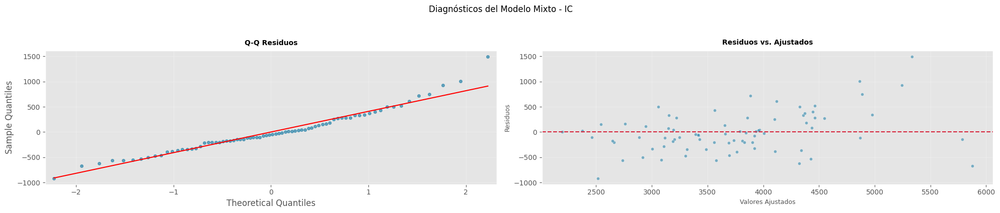


    🔍 ANÁLISIS DE SENSIBILIDAD - IC
    ▪ Modelo mixto: β = -542.39 (IC95% -785.07--299.72, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-760.19, -301.10]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.16, -1.56]
────────────────────────────────────────────────────────────────────────────────


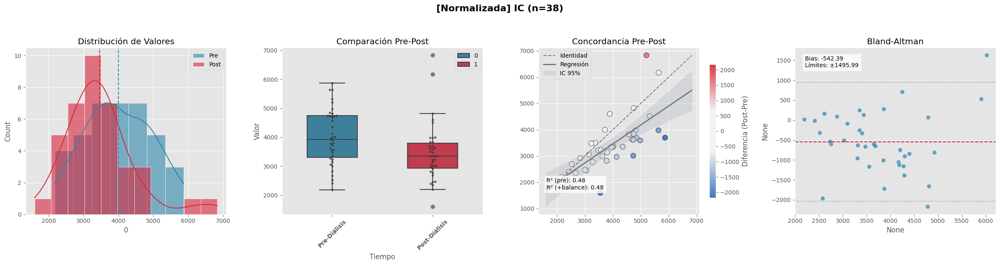


    📊 ANÁLISIS ESTADÍSTICO - IC
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.54 (-0.79 a -0.29)
    ▪ Diferencia media (IC 95%) [Original]: -542.39 (-785.08 a -299.71)
    ▪ Prueba de normalidad: W = 0.982, p = 0.7793
    ▪ Prueba seleccionada: t(37) = 4.38, p = 0.0001
    ▪ Tamaño del efecto (Cohen's d): -0.71
    ▪ R² (solo pre): 0.482
    ▪ R² (pre + balance): 0.482
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en IC: 18 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


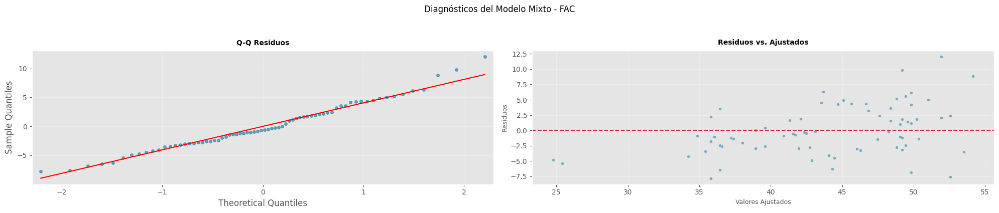


    🔍 ANÁLISIS DE SENSIBILIDAD - FAC
    ▪ Modelo mixto: β = -0.64 (IC95% -3.08-1.80, p=0.6080)
    ▪ Bootstrapping BCa (IC95%): [-2.94, 1.97]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.10, -1.56]

    ⚠ ADVERTENCIAS:
    - 2/38 pacientes excluidos (5.3%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


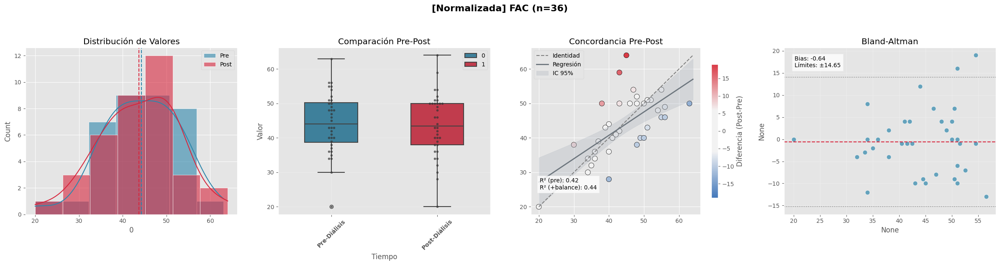


    📊 ANÁLISIS ESTADÍSTICO - FAC
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.07 (-0.36 a 0.21)
    ▪ Diferencia media (IC 95%) [Original]: -0.64 (-3.08 a 1.80)
    ▪ Prueba de normalidad: W = 0.956, p = 0.1670
    ▪ Prueba seleccionada: t(35) = 0.51, p = 0.6112
    ▪ Tamaño del efecto (Cohen's d): -0.09
    ▪ R² (solo pre): 0.422
    ▪ R² (pre + balance): 0.439
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en FAC: 1076 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


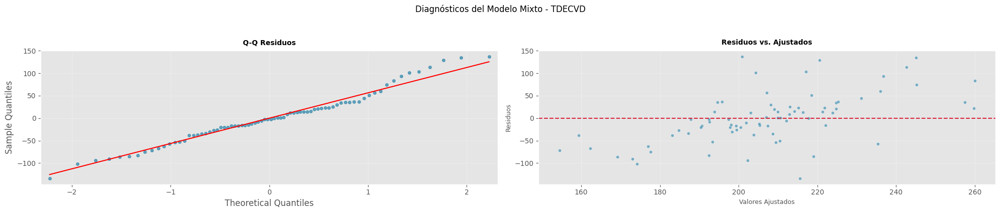


    🔍 ANÁLISIS DE SENSIBILIDAD - TDECVD
    ▪ Modelo mixto: β = 14.74 (IC95% -13.65-43.12, p=0.3089)
    ▪ Bootstrapping BCa (IC95%): [-16.39, 40.13]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.23, -1.65]
────────────────────────────────────────────────────────────────────────────────


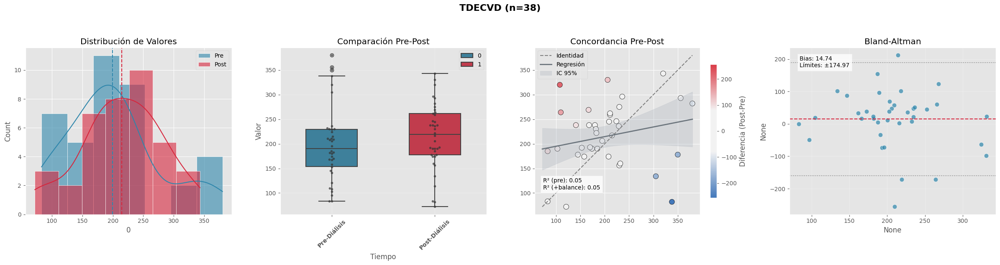


    📊 ANÁLISIS ESTADÍSTICO - TDECVD
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.21 (-0.21 a 0.62)
    ▪ Diferencia media (IC 95%) [Original]: 14.74 (-13.65 a 43.12)
    ▪ Prueba de normalidad: W = 0.930, p = 0.0197
    ▪ Prueba seleccionada: Z = -1.893, p = 0.0925
    ▪ Tamaño del efecto (Cohen's d): 0.17
    ▪ R² (solo pre): 0.051
    ▪ R² (pre + balance): 0.053
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TdecVD: 290 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


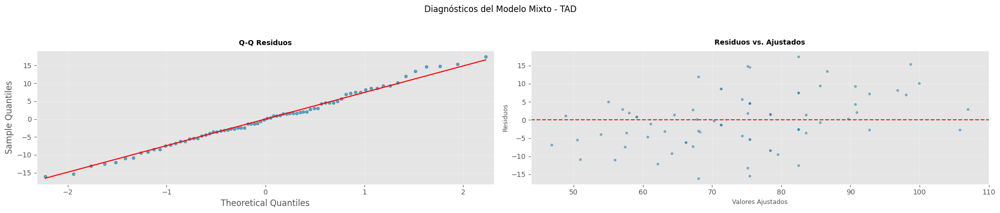


    🔍 ANÁLISIS DE SENSIBILIDAD - TAD
    ▪ Modelo mixto: β = -7.11 (IC95% -11.51--2.70, p=0.0016)
    ▪ Bootstrapping BCa (IC95%): [-11.70, -2.95]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.09, -1.58]
────────────────────────────────────────────────────────────────────────────────


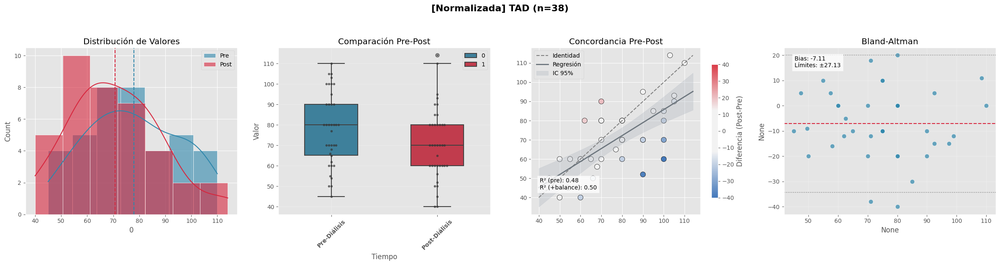


    📊 ANÁLISIS ESTADÍSTICO - TAD
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.40 (-0.66 a -0.14)
    ▪ Diferencia media (IC 95%) [Original]: -7.11 (-11.51 a -2.70)
    ▪ Prueba de normalidad: W = 0.969, p = 0.3722
    ▪ Prueba seleccionada: t(37) = 3.16, p = 0.0031
    ▪ Tamaño del efecto (Cohen's d): -0.51
    ▪ R² (solo pre): 0.476
    ▪ R² (pre + balance): 0.500
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en TAD: 32 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


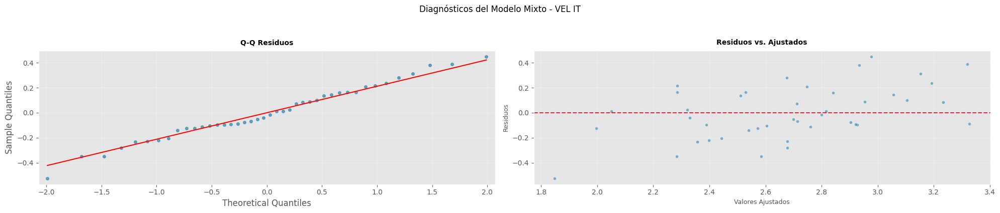


    🔍 ANÁLISIS DE SENSIBILIDAD - VEL IT
    ▪ Modelo mixto: β = -0.39 (IC95% -0.59--0.19, p=0.0001)
    ▪ Bootstrapping BCa (IC95%): [-0.65, -0.27]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.13, -1.59]

    ⚠ ADVERTENCIAS:
    - 22/38 pacientes excluidos (57.9%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


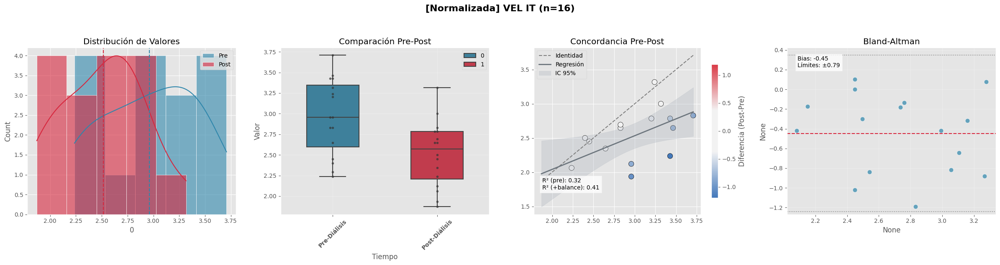


    📊 ANÁLISIS ESTADÍSTICO - VEL IT
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.91 (-1.35 a -0.47)
    ▪ Diferencia media (IC 95%) [Original]: -0.45 (-0.65 a -0.25)
    ▪ Prueba de normalidad: W = 0.943, p = 0.3814
    ▪ Prueba seleccionada: t(15) = 4.42, p = 0.0005
    ▪ Tamaño del efecto (Cohen's d): -1.11
    ▪ R² (solo pre): 0.322
    ▪ R² (pre + balance): 0.410
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en vel it: 9 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


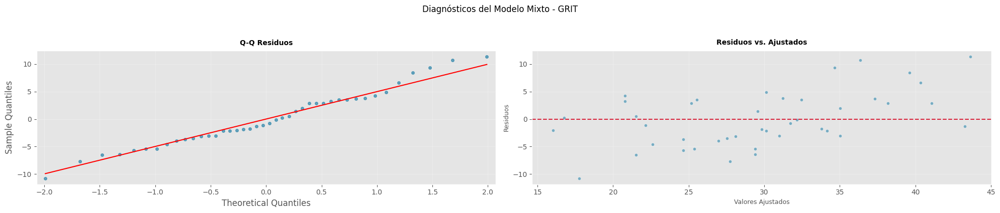


    🔍 ANÁLISIS DE SENSIBILIDAD - GRIT
    ▪ Modelo mixto: β = -8.61 (IC95% -13.16--4.07, p=0.0002)
    ▪ Bootstrapping BCa (IC95%): [-14.72, -5.72]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.07, -1.67]

    ⚠ ADVERTENCIAS:
    - 22/38 pacientes excluidos (57.9%)
    - Diferencias significativas en covariables:
────────────────────────────────────────────────────────────────────────────────


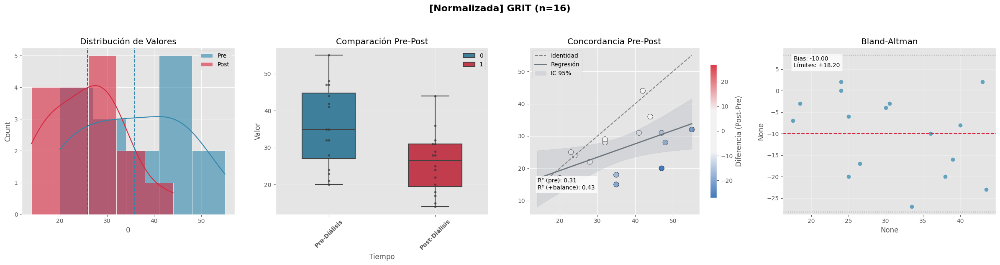


    📊 ANÁLISIS ESTADÍSTICO - GRIT
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.96 (-1.43 a -0.48)
    ▪ Diferencia media (IC 95%) [Original]: -10.00 (-14.55 a -5.45)
    ▪ Prueba de normalidad: W = 0.931, p = 0.2565
    ▪ Prueba seleccionada: t(15) = 4.31, p = 0.0006
    ▪ Tamaño del efecto (Cohen's d): -1.08
    ▪ R² (solo pre): 0.306
    ▪ R² (pre + balance): 0.434
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en grIT: 9 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


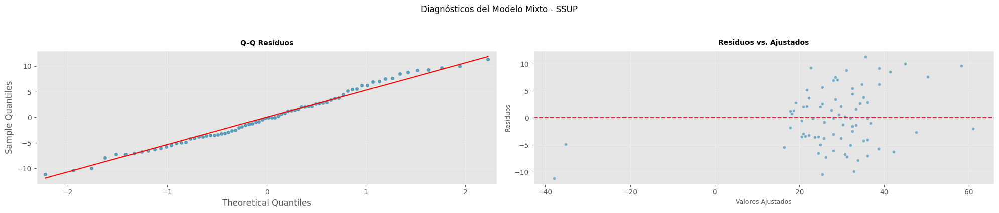


    🔍 ANÁLISIS DE SENSIBILIDAD - SSUP
    ▪ Modelo mixto: β = 2.71 (IC95% -0.55-5.97, p=0.1035)
    ▪ Bootstrapping BCa (IC95%): [-0.50, 5.87]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.19, -1.45]
────────────────────────────────────────────────────────────────────────────────


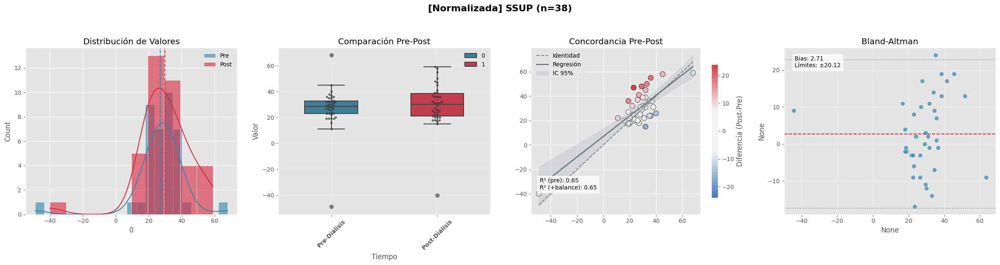


    📊 ANÁLISIS ESTADÍSTICO - SSUP
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.17 (-0.04 a 0.38)
    ▪ Diferencia media (IC 95%) [Original]: 2.71 (-0.55 a 5.97)
    ▪ Prueba de normalidad: W = 0.979, p = 0.6787
    ▪ Prueba seleccionada: t(37) = -1.63, p = 0.1120
    ▪ Tamaño del efecto (Cohen's d): 0.26
    ▪ R² (solo pre): 0.645
    ▪ R² (pre + balance): 0.646
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Ssup: 115 pacientes.
    
────────────────────────────────────────────────────────────────────────────────
⚠ Varianza cero en Paciente. Tamaño de efecto indefinido.


/var/folders/s7/6ncckdrj32j81xfl9hjxkzkr0000gn/T/ipykernel_8739/4071510342.py:132: RuntimeWarning: invalid value encountered in scalar divide
  cohen_d_z = mean_diff_z / sd_diff_z


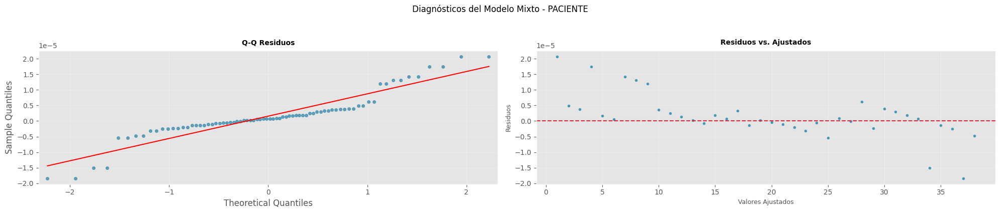

/Users/bita/.pyenv/versions/3.11.7/envs/proyecto_gv/lib/python3.11/site-packages/scipy/stats/_resampling.py:147: RuntimeWarning: invalid value encountered in scalar divide
  a_hat = 1/6 * sum(nums) / sum(dens)**(3/2)
/Users/bita/.pyenv/versions/3.11.7/envs/proyecto_gv/lib/python3.11/site-packages/scipy/_lib/_util.py:440: DegenerateDataWarning: The BCa confidence interval cannot be calculated. This problem is known to occur when the distribution is degenerate or the statistic is np.min.
  return fun(*args, **kwargs)
/Users/bita/.pyenv/versions/3.11.7/envs/proyecto_gv/lib/python3.11/site-packages/scipy/stats/_axis_nan_policy.py:586: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)



    🔍 ANÁLISIS DE SENSIBILIDAD - PACIENTE
    ▪ Modelo mixto: β = 0.00 (IC95% -0.00-0.00, p=1.0000)
    ▪ Bootstrapping BCa (IC95%): [nan, nan]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.09, -1.56]
────────────────────────────────────────────────────────────────────────────────


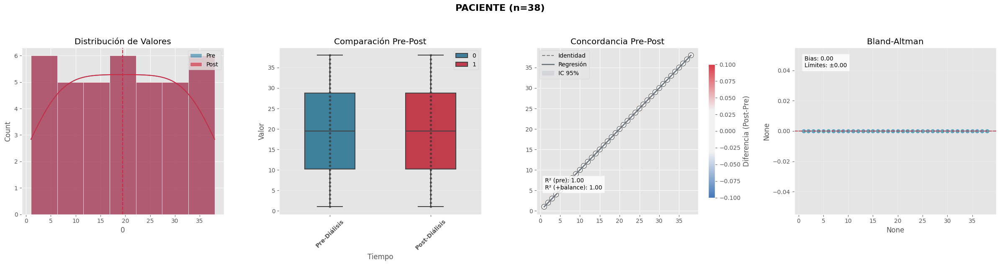


    📊 ANÁLISIS ESTADÍSTICO - PACIENTE
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.00 (0.00 a 0.00)
    ▪ Diferencia media (IC 95%) [Original]: 0.00 (0.00 a 0.00)
    ▪ Prueba de normalidad: W = 1.000, p = 1.0000
    ▪ Prueba seleccionada: t(37) = nan, p = nan
    ▪ Tamaño del efecto (Cohen's d): nan
    ▪ R² (solo pre): 1.000
    ▪ R² (pre + balance): 1.000
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en Paciente: nan pacientes.
    
────────────────────────────────────────────────────────────────────────────────


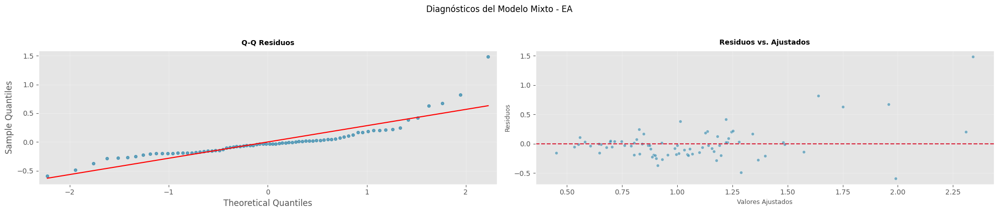


    🔍 ANÁLISIS DE SENSIBILIDAD - EA
    ▪ Modelo mixto: β = -0.35 (IC95% -0.51--0.19, p=0.0000)
    ▪ Bootstrapping BCa (IC95%): [-0.57, -0.22]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.12, -1.61]
────────────────────────────────────────────────────────────────────────────────


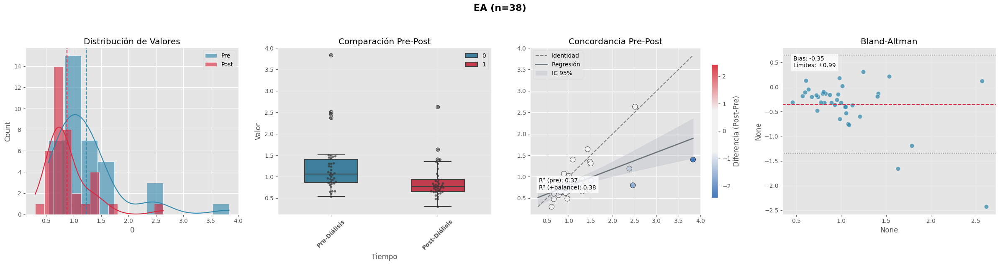


    📊 ANÁLISIS ESTADÍSTICO - EA
    ▪ Diferencia media (IC 95%) [Estandarizada]: -0.63 (-0.93 a -0.33)
    ▪ Diferencia media (IC 95%) [Original]: -0.35 (-0.51 a -0.19)
    ▪ Prueba de normalidad: W = 0.770, p = 0.0000
    ▪ Prueba seleccionada: Z = -4.445, p = 0.0000
    ▪ Tamaño del efecto (Cohen's d): -0.69
    ▪ R² (solo pre): 0.369
    ▪ R² (pre + balance): 0.377
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en EA: 19 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


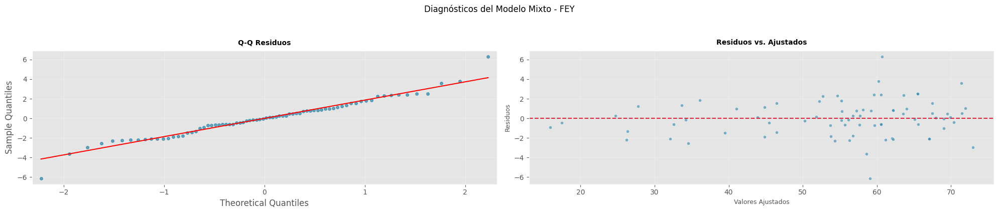


    🔍 ANÁLISIS DE SENSIBILIDAD - FEY
    ▪ Modelo mixto: β = 1.58 (IC95% 0.39-2.77, p=0.0094)
    ▪ Bootstrapping BCa (IC95%): [0.50, 2.74]
    ▪ Referencia (Eeprim): IC95% bootstrap = [-4.10, -1.45]
────────────────────────────────────────────────────────────────────────────────


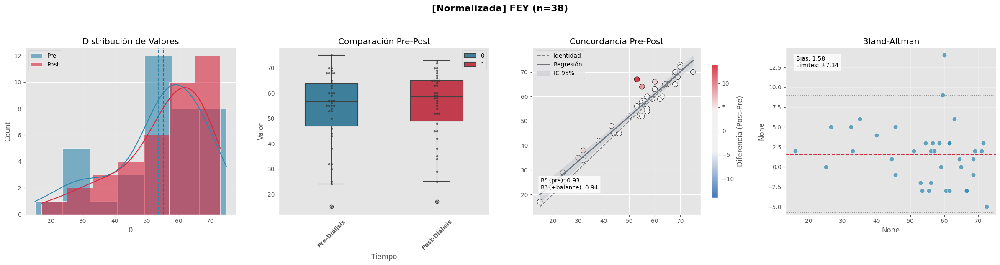


    📊 ANÁLISIS ESTADÍSTICO - FEY
    ▪ Diferencia media (IC 95%) [Estandarizada]: 0.11 (0.02 a 0.20)
    ▪ Diferencia media (IC 95%) [Original]: 1.58 (0.39 a 2.77)
    ▪ Prueba de normalidad: W = 0.933, p = 0.0246
    ▪ Prueba seleccionada: Z = -2.661, p = 0.0357
    ▪ Tamaño del efecto (Cohen's d): 0.42
    ▪ R² (solo pre): 0.934
    ▪ R² (pre + balance): 0.939
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en FEy: 47 pacientes.
    
────────────────────────────────────────────────────────────────────────────────


In [76]:


print("═"*60)
print(f"Variables excluidas por >{missing_threshold:.0%} missing:")
print(set(initial_variables) - set(variables_to_analyze))
print("═"*60)


def analyze_missing_data(df, variables, covariates):
    missing_summary = []
    for var in variables:
        if var in it_dependent_vars:
            valid_patients = df[df['IT_status'] == 1]['Paciente'].unique()
            temp_df = df[df['Paciente'].isin(valid_patients)]
        else:
            temp_df = df
        total_pacientes = df['Paciente'].nunique()
        pre_missing = temp_df[temp_df['POSDIAL'] == 0][var].isna().sum()
        post_missing = temp_df[temp_df['POSDIAL'] == 1][var].isna().sum()
        merged = df.pivot(index='Paciente', columns='POSDIAL', values=var).dropna()
        n_paired = len(merged)
        mcar_results = {}
        for covar in covariates:
            try:
                if df[covar].dtype == 'object' or df[covar].nunique() < 5:
                    contingency = pd.crosstab(df[var].isna(), df[covar])
                    _, pval, _, _ = chi2_contingency(contingency)
                else:
                    present_data = df[df[var].notna()][covar]
                    missing_data = df[df[var].isna()][covar]
                    _, pval = ttest_ind(present_data, missing_data, nan_policy='omit')
                mcar_results[covar] = f"{pval:.3f}"
            except:
                mcar_results[covar] = "Error"
        missing_summary.append({
            'Variable': var,
            'Pacientes Totales': total_pacientes,
            'Pre-Missing (%)': f"{(pre_missing/total_pacientes)*100:.1f}%",
            'Post-Missing (%)': f"{(post_missing/total_pacientes)*100:.1f}%",
            'Pares Completos': n_paired,
            **{f'MCAR_{covar}': mcar_results.get(covar, 'No Data') for covar in covariates},
            'Significativas (p<0.05)': sum(
                1 for v in mcar_results.values() if isinstance(v, str) and v.replace('.','').isdigit() and float(v) < 0.05)
        })
    return pd.DataFrame(missing_summary)


def calcular_tamano_muestra(df, variable, alpha=0.05, potencia=0.80):
    merged = df.pivot(index='Paciente', columns='POSDIAL', values=variable).dropna()
    diffs = merged[1] - merged[0]
    
    if diffs.std(ddof=1) == 0:
        print(f"⚠ Varianza cero en {variable}. Tamaño de efecto indefinido.")
        return np.nan
    
    tamano_efecto = diffs.mean() / diffs.std(ddof=1)
    power_analysis = TTestPower()
    n = power_analysis.solve_power(effect_size=tamano_efecto, alpha=alpha, power=potencia, alternative='two-sided')

    return math.ceil(n)


def bootstrap_analysis(merged, n_iterations=1000):
    """Análisis de bootstrapping para diferencias pareadas usando scipy"""
    try:
        # Convertir a formato requerido por scipy bootstrap
        data = (merged[1].values, merged[0].values)  # (post, pre)

        # Definir estadístico: diferencia de medias post-pre
        def statistic(post, pre):
            return np.mean(post - pre)

        # Configurar bootstrap
        res = bootstrap(data, statistic, n_resamples=n_iterations,
                        paired=True, confidence_level=0.95,
                        method='BCa')

        return {
            'bootstrap_ci_lower': res.confidence_interval.low,
            'bootstrap_ci_upper': res.confidence_interval.high,
            'bootstrap_dist': res.bootstrap_distribution
        }
    except Exception as e:
        print(f"Error en bootstrapping: {str(e)}")
        return None

def mixed_model_analysis(df, variable):
    try:
        safe_var = variable.replace(" ", "_")
        df_clean = df.rename(columns={variable: safe_var}).dropna(subset=[safe_var])

        formula = f'Q("{safe_var}") ~ POSDIAL'

        model = mixedlm(formula,
                       df_clean,
                       groups=df_clean['Paciente'],
                       re_formula="1").fit(reml=True)

        return {
            'model': model,  # Objeto del modelo para diagnósticos
            'effect': model.params['POSDIAL'],
            'p_value': model.pvalues['POSDIAL'],
            'ci_lower': model.conf_int().loc['POSDIAL'][0],
            'ci_upper': model.conf_int().loc['POSDIAL'][1]
        }
    except Exception as e:
        print(f"Error en modelo mixto para {variable}: {str(e)}")
        return None

    
plt.style.use('ggplot')
sns.set_palette(["#2E86AB", "#D7263D"])

def paired_analysis(df, df_z, variable, min_paired=10, alpha=0.05, potencia=0.80, tamano_efecto=0.5):
    n_requerido = calcular_tamano_muestra(df, variable)

    merged = df.pivot(index='Paciente', columns='POSDIAL', values=variable).dropna()
    n = len(merged)

    if n < min_paired:
        print(f"\n⚠ {variable}: Datos insuficientes (n={n})")
        return

    merged_z = df_z.pivot(index='Paciente_z', columns='POSDIAL_z', values=f"{variable}_z").dropna()
    pre, post = merged[0], merged[1]
    pre_z, post_z = merged_z[0], merged_z[1]
    diffs, diffs_z = post - pre, post_z - pre_z

    norm_flag = "[Normalizada] " if variable in variables_ else ""
    mean_diff_z, sd_diff_z = diffs_z.mean(), diffs_z.std(ddof=1)
    t_critical = t.ppf(0.975, df=n-1)
    ci_lower_z = mean_diff_z - t_critical * (sd_diff_z/np.sqrt(n))
    ci_upper_z = mean_diff_z + t_critical * (sd_diff_z/np.sqrt(n))
    cohen_d_z = mean_diff_z / sd_diff_z

    # 1. Modelo de efectos mixtos
    mixed_results = mixed_model_analysis(df, variable)

    if mixed_results and 'model' in mixed_results:
        model = mixed_results['model']
        residuos = model.resid
        ajustados = model.fittedvalues
    
        # Configurar figura única con 2 columnas (mismo estilo que gráficos principales)
        fig_diag, axs_diag = plt.subplots(1, 2, figsize=(20, 4), dpi=100)
        plt.suptitle(f"Diagnósticos del Modelo Mixto - {variable.upper()}", fontsize=12, y=1.05)
    
        # 1. Gráfico Q-Q
        sm.qqplot(residuos, line='s', markersize=4, alpha=0.7, ax=axs_diag[0], markerfacecolor='#2E86AB', markeredgecolor='#2E86AB')
        axs_diag[0].set_title(f'Q-Q Residuos', fontsize=10, pad=8, fontweight='bold')
        axs_diag[0].grid(True, alpha=0.3)
    
        # 2. Homocedasticidad
        axs_diag[1].scatter(ajustados, residuos, s=20, alpha=0.6, color='#2E86AB', edgecolor='w')
        axs_diag[1].axhline(0, color='#D7263D', linestyle='--', linewidth=1.5)
        axs_diag[1].set_xlabel('Valores Ajustados', fontsize=9)
        axs_diag[1].set_ylabel('Residuos', fontsize=9)
        axs_diag[1].set_title(f'Residuos vs. Ajustados', fontsize=10, pad=8, fontweight='bold')
        axs_diag[1].grid(True, alpha=0.3)
    
        plt.tight_layout()
        plt.show()

    # 2. Bootstrapping con scipy
    bootstrap_results = bootstrap_analysis(merged) if n >= 10 else None

    # 3. Comparación con variables completas (Eeprim)
    referencia_results = None
    if 'Eeprim' in variables_to_analyze and variable != 'Eeprim':
        ref_merged = df.pivot(index='Paciente', columns='POSDIAL', values='Eeprim').dropna()
        referencia_results = bootstrap_analysis(ref_merged)

    # Construir texto de resultados
    sensibilidad_text = f"""
    🔍 ANÁLISIS DE SENSIBILIDAD - {variable.upper()}
    ▪ Modelo mixto: β = {mixed_results['effect']:.2f} (IC95% {mixed_results['ci_lower']:.2f}-{mixed_results['ci_upper']:.2f}, p={mixed_results['p_value']:.4f})""" if mixed_results else ""

    if bootstrap_results:
        sensibilidad_text += f"""
    ▪ Bootstrapping BCa (IC95%): [{bootstrap_results['bootstrap_ci_lower']:.2f}, {bootstrap_results['bootstrap_ci_upper']:.2f}]"""

    if referencia_results:
        sensibilidad_text += f"""
    ▪ Referencia (Eeprim): IC95% bootstrap = [{referencia_results['bootstrap_ci_lower']:.2f}, {referencia_results['bootstrap_ci_upper']:.2f}]"""

    print(sensibilidad_text)

    # Advertencias sobre sesgo
    n_total = df['Paciente'].nunique()
    n_missing = n_total - n
    if n_missing > 0:
        print(f"""
    ⚠ ADVERTENCIAS:
    - {n_missing}/{n_total} pacientes excluidos ({n_missing/n_total:.1%})
    - Diferencias significativas en covariables:""")

        missing_patients = set(df['Paciente']) - set(merged.index)
        df_incluidos = df[~df['Paciente'].isin(missing_patients)]
        df_excluidos = df[df['Paciente'].isin(missing_patients)]

        for cov in pin_vars:
            try:
                if pd.api.types.is_numeric_dtype(df[cov]):
                    stat, pval = ttest_ind(
                        df_incluidos[cov].dropna(),
                        df_excluidos[cov].dropna(),
                        equal_var=False
                    )
                else:
                    cont_table = pd.crosstab(
                        df['Paciente'].isin(missing_patients),
                        df[cov]
                    )
                    _, pval, _, _ = chi2_contingency(cont_table)

                if pval < 0.1:
                    print(f"    - {cov}: p={pval:.3f}")
            except:
                continue

    print('─'*80)



    shapiro_stat, shapiro_p = shapiro(diffs_z)
    X = sm.add_constant(pre)
    modelo = sm.OLS(post, X).fit()
    beta0, beta1 = modelo.params
    r2 = modelo.rsquared
    
    X_balance = pd.DataFrame({
    'pre': pre,
    'balance': df.loc[pre.index, 'BALANCE']  # Asumiendo BALANCE es por paciente
        })
    X_balance = sm.add_constant(X_balance)
    modelo_balance = sm.OLS(post, X_balance).fit()

    fig, axs = plt.subplots(1, 4, figsize=(24, 6), dpi=100)
    fig.suptitle(f"{norm_flag}{variable.upper()} (n={n})", fontsize=16, y=1.05, fontweight='bold')

    sns.histplot(pre, ax=axs[0], color='#2E86AB', kde=True, edgecolor='w', alpha=0.6, label='Pre')
    sns.histplot(post, ax=axs[0], color='#D7263D', kde=True, edgecolor='w', alpha=0.6, label='Post')
    axs[0].axvline(pre.mean(), color='#2E86AB', linestyle='--', linewidth=1.5)
    axs[0].axvline(post.mean(), color='#D7263D', linestyle='--', linewidth=1.5)
    axs[0].set_title('Distribución de Valores')
    axs[0].legend()

    melted = pd.melt(merged.reset_index(), id_vars='Paciente', value_vars=[0,1], var_name='Tiempo', value_name='Valor')
    sns.boxplot(x='Tiempo', y='Valor', data=melted, ax=axs[1], width=0.5, linewidth=1.5, hue='Tiempo')
    axs[1].set_xticks([0, 1])
    axs[1].set_xticklabels(['Pre-Diálisis', 'Post-Diálisis'], fontweight='bold', rotation=45)
    sns.swarmplot(x='Tiempo', y='Valor', data=melted, ax=axs[1], color='#333333', size=4, alpha=0.7)
    axs[1].set_title('Comparación Pre-Post')
    axs[1].grid(True, alpha=0.3)

    min_val, max_val = min(pre.min(), post.min()), max(pre.max(), post.max())
    x_pred = np.linspace(min_val, max_val, 100)
    X_pred = sm.add_constant(x_pred)
    y_pred = modelo.predict(X_pred)
    pred_int = modelo.get_prediction(X_pred).conf_int()
    palette = sns.diverging_palette(250, 10, sep=80, as_cmap=True)
    vmax = max(abs(diffs.max()), abs(diffs.min()))
    scatter = axs[2].scatter(pre, post, c=diffs, cmap=palette, vmin=-vmax, vmax=vmax, edgecolor='k', s=80)
    plt.colorbar(scatter, ax=axs[2], shrink=0.8).set_label('Diferencia (Post-Pre)')
    axs[2].plot([min_val, max_val], [min_val, max_val], '--', color='gray', label="Identidad")
    axs[2].plot(x_pred, y_pred, color='#6C757D', linewidth=2, label="Regresión")
    axs[2].fill_between(x_pred, pred_int[:,0], pred_int[:,1], color='#AAB2BD', alpha=0.3, label="IC 95%")
    axs[2].text(0.05, 0.15, 
            f'R² (pre): {r2:.2f}\nR² (+balance): {modelo_balance.rsquared:.2f}',
            transform=axs[2].transAxes,
            bbox=dict(facecolor='white', alpha=0.8))
    axs[2].set_title('Concordancia Pre-Post')
    axs[2].legend()

    avg = (pre + post)/2
    mean_diff = diffs.mean()
    std_diff = diffs.std(ddof=1)
    upper_loa = mean_diff + 1.96 * std_diff
    lower_loa = mean_diff - 1.96 * std_diff
    sns.scatterplot(x=avg, y=diffs, ax=axs[3], color='#2E86AB', s=60, alpha=0.7)
    axs[3].axhline(mean_diff, color='#D7263D', linestyle='--', linewidth=1.5)
    axs[3].axhline(upper_loa, color='gray', linestyle=':', linewidth=1.2)
    axs[3].axhline(lower_loa, color='gray', linestyle=':', linewidth=1.2)
    axs[3].text(0.05, 0.95, f'Bias: {mean_diff:.2f}\nLímites: ±{1.96*std_diff:.2f}',
                transform=axs[3].transAxes, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.8))
    axs[3].set_title('Bland-Altman')
    axs[3].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    if shapiro_p > 0.05:
        test_result = ttest_rel(pre_z, post_z)
        test_type = f"t({n-1}) = {test_result.statistic:.2f}, p = {test_result.pvalue:.4f}"
    else:
        test_result = wilcoxon(pre_z, post_z, mode='approx')
        Z = (test_result.statistic - (n*(n+1)/4)) / np.sqrt(n*(n+1)*(2*n+1)/24)
        test_type = f"Z = {Z:.3f}, p = {test_result.pvalue:.4f}"

    print(f"""
    📊 ANÁLISIS ESTADÍSTICO - {variable.upper()}
    ▪ Diferencia media (IC 95%) [Estandarizada]: {mean_diff_z:.2f} ({ci_lower_z:.2f} a {ci_upper_z:.2f})
    ▪ Diferencia media (IC 95%) [Original]: {diffs.mean():.2f} ({diffs.mean()-1.96*diffs.std()/np.sqrt(n):.2f} a {diffs.mean()+1.96*diffs.std()/np.sqrt(n):.2f})
    ▪ Prueba de normalidad: W = {shapiro_stat:.3f}, p = {shapiro_p:.4f}
    ▪ Prueba seleccionada: {test_type}
    ▪ Tamaño del efecto (Cohen's d): {cohen_d_z:.2f}
    ▪ R² (solo pre): {r2:.3f}
    ▪ R² (pre + balance): {modelo_balance.rsquared:.3f}
    ▪ Tamaño de muestra requerido para detectar un efecto significativo en {variable}: {n_requerido} pacientes.
    """)
    print('─'*80)

missing_df = analyze_missing_data(df, variables_to_analyze, pin_vars)
print("\n[ANÁLISIS DE VALORES PERDIDOS - VARIABLES INCLUIDAS]")
print(tabulate(missing_df, headers='keys', tablefmt='pretty', showindex=False))

print("ANÁLISIS LONGITUDINAL PAREADO")
print("═"*60)
for var in var_numericas:
    paired_analysis(df, df_z, var)

# MATERIALES Y *METODOS*

**2.4. Manejo de Datos y Análisis Estadístico**

*2.4.1. Preprocesamiento:*

*Valores faltantes:* 

Mediante análisis multivariado (Missing Completely at Random, MCAR), se evaluó la asociación de datos faltantes con variables clínicas clave (hipertensión, diabetes, sexo, dislipidemia) usando pruebas χ² (categóricas) y t-test (continuas). Variables con >30% faltantes en cualquier momento (pre/post) se excluyeron del análisis longitudinal.

*Normalización:*

Variables con unidades no directamente interpretables (e.g., índices ecocardiográficos derivados) se estandarizaron mediante escalado Z.
2.4.2. Análisis Estadístico:

*Normalidad:*

Evaluada con prueba de Shapiro-Wilk (α=0.05).

*Comparaciones pre-post:*

t-test pareado (datos normales) o prueba de Wilcoxon (no paramétricos), aplicados a datos estandarizados para homogenizar escalas.

*Tamaño del efecto:*

Cohen’s d en escala estandarizada (d=0.2: pequeño; d=0.5: moderado; d≥0.8: grande).

*Concordancia:*

Modelos de regresión lineal con IC 95% y gráficos de Bland-Altman (límites de acuerdo: ±1.96 DE).

*Visualización:* Histogramas superpuestos, diagramas de caja con swarmplots, y análisis de tendencia.

**2.4.3. Consideraciones Éticas y Software:**

Los datos se anonimizaron asignando identificadores únicos no vinculables. El análisis se implementó en Python 3.10 (SciPy v1.11, pandas v2.0.3, statsmodels v0.14), con visualización en matplotlib v3.7.1 y seaborn v0.12.2. El código cumple estándares FAIR y está disponible en [repositorio].